In [1]:
# Imports and utils
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
from numpy import zeros, ones 
import numpy as np
from numpy.random import randn, randint
import tensorflow as tf
from matplotlib import pyplot as plt
from model.dcgan_cifar import discriminator_, generator_, dcgan_
from utils.dataset_utils import return_cifar10 
from utils.model_utils import true_samples_generator, fake_samples_generator, make_latent_samples
from utils.visualizers_utils import show_generated_images, performance_summarizer
from tqdm.notebook import tqdm
from utils.visualizers_utils import show_gan_losses
import imageio
from glob import glob
import re
from utils.visualizers_utils import generate_video 
from utils.image_utils import preprocess_image, scaleback_image, image_loader
from tensorflow.keras.utils import plot_model
from scipy.io import loadmat

Number of images in the train set:  (73257, 32, 32, 3)
********************
Original Images
********************


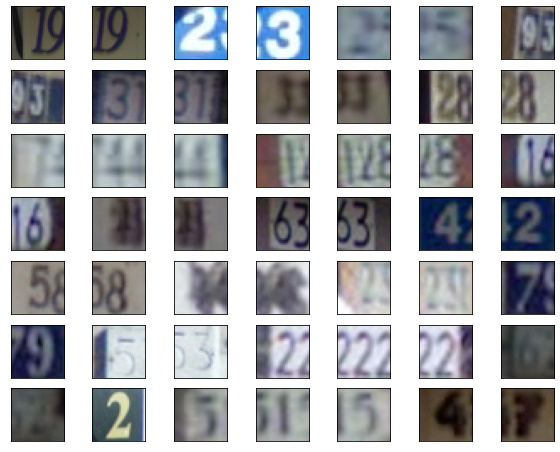

In [4]:
#Load SVHN dataset
X_train = loadmat('data/shvn/train.mat')['X']
X_train = np.rollaxis(X_train, 3) 
# print(X_train) 
# print(X_train[:100])
print("Number of images in the train set: ", X_train.shape)
# print("shape of each image is :", plt.imread(X_train[0]).shape)

print('*'*20)
print("Original Images")
print('*'*20)

#Display images from SVHN dataset
plt.figure(figsize=(10, 8))
for i in range(49):
#     image = plt.imread(X_train[i])
    plt.subplot(7, 7, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_train[i])

plt.show()

In [3]:
# Function to train the generator and discriminator
def train(generator, discriminator, dcgan, data, samplesize, epochs=200, batch_size=128, model_name=None):
    print(f' Training {model_name} ......')
    num_batches = int(data.shape[0] / batch_size)
    half_batch = int(batch_size / 2)

    discriminator_losses = []
    generator_losses = []
    
    #To generate Flowcharts and Summary for generator, discriminator and DCGAN
    print("Generator Flowchart:")
    tf.keras.utils.plot_model(generator, to_file = 'flowcharts/generator_flowchart.png')
    print("Generator Summary:")
    generator.summary()

    print("Discriminator Flowchart:")
    tf.keras.utils.plot_model(discriminator, to_file = 'flowcharts/discriminator_flowchart.png')
    print("Discriminator Summary:")
    discriminator.summary()

    print("DCGAN Flowchart:")
    tf.keras.utils.plot_model(dcgan, to_file = 'flowcharts/gan_flowchart.png')
    print("DCGAN Summary:")
    dcgan.summary()
    
 
    # manually enumerate epochs
    for epoch in tqdm(range(epochs)):
        generator_loss_epoch = 0 
        discriminator_loss_epoch = 0 

        # enumerate batches over the training set
        for batch in tqdm(range(num_batches)):
            X_batch_real = X_train[batch*batch_size:(batch+1)*batch_size]
            
            X_batch_real =  X_batch_real.astype('float32')
            X_batch_real = (X_batch_real-127.5)/127.5
    
            # get randomly selected 'real' samples
            X_real, y_real = true_samples_generator(X_batch_real, half_batch)
            # update discriminator model weights
            discriminator_real_loss, _ = discriminator.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = fake_samples_generator(half_batch, samplesize, generator)
            # update discriminator model weights
            discriminator_fake_loss, _ = discriminator.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = make_latent_samples( samplesize, batch_size)
            # create inverted labels for the fake samples
            y_gan = np.ones((batch_size, 1))
            # update the generator via the discriminator's error
            generator_loss = dcgan.train_on_batch(X_gan, y_gan)

            #update the losses
            discriminator_loss_epoch += (discriminator_real_loss + discriminator_fake_loss)
            generator_loss_epoch += (generator_loss)

            # summarize loss on this batch
            if batch % 100 == 0:
                print(f' Epoch: {epoch + 1}, Batch: {batch + 1} of {num_batches}')
                print(f' Discriminator real loss: {discriminator_real_loss}, Discriminator Fake loss: {discriminator_fake_loss}, Generator loss: {generator_loss}')

        discriminator_losses.append(discriminator_loss_epoch)
        generator_losses.append(generator_loss_epoch)
        performance_summarizer(epoch, generator, discriminator, X_batch_real, samplesize, model_name=model_name)
    show_gan_losses(generator_losses, discriminator_losses, save_to= f'results/{model_name}/')
    print("Done with training the model ......")
    return generator

 Training DCGAN_SVHN_NOBN ......


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 1, Batch: 1 of 1144
 Discriminator real loss: 0.7203451991081238, Discriminator Fake loss: 0.6960838437080383, Generator loss: 0.6909711956977844
 Epoch: 1, Batch: 101 of 1144
 Discriminator real loss: 0.7408125996589661, Discriminator Fake loss: 0.7142317295074463, Generator loss: 1.7850549221038818
 Epoch: 1, Batch: 201 of 1144
 Discriminator real loss: 0.5494883060455322, Discriminator Fake loss: 0.25211143493652344, Generator loss: 1.8775734901428223
 Epoch: 1, Batch: 301 of 1144
 Discriminator real loss: 0.3086932301521301, Discriminator Fake loss: 0.3421023488044739, Generator loss: 1.4475327730178833
 Epoch: 1, Batch: 401 of 1144
 Discriminator real loss: 0.6994830965995789, Discriminator Fake loss: 0.5553970336914062, Generator loss: 0.909783124923706
 Epoch: 1, Batch: 501 of 1144
 Discriminator real loss: 0.7733798027038574, Discriminator Fake loss: 0.5736123323440552, Generator loss: 1.0299124717712402
 Epoch: 1, Batch: 601 of 1144
 Discriminator real loss: 0.83993178

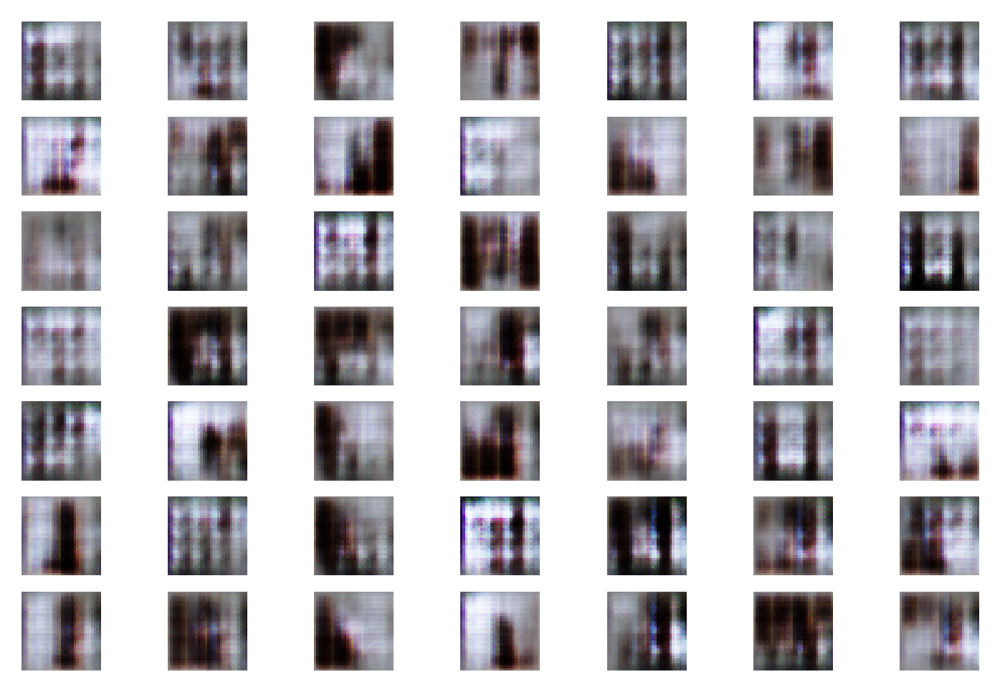

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 2, Batch: 1 of 1144
 Discriminator real loss: 0.5810405015945435, Discriminator Fake loss: 0.49508562684059143, Generator loss: 1.2033886909484863
 Epoch: 2, Batch: 101 of 1144
 Discriminator real loss: 0.6903543472290039, Discriminator Fake loss: 0.7122002243995667, Generator loss: 0.8463401794433594
 Epoch: 2, Batch: 201 of 1144
 Discriminator real loss: 0.7098352909088135, Discriminator Fake loss: 0.6822148561477661, Generator loss: 0.8672230243682861
 Epoch: 2, Batch: 301 of 1144
 Discriminator real loss: 0.7367918491363525, Discriminator Fake loss: 0.7140408158302307, Generator loss: 0.7418188452720642
 Epoch: 2, Batch: 401 of 1144
 Discriminator real loss: 0.6076627373695374, Discriminator Fake loss: 0.889916181564331, Generator loss: 0.6629137992858887
 Epoch: 2, Batch: 501 of 1144
 Discriminator real loss: 0.5973858833312988, Discriminator Fake loss: 0.6537519693374634, Generator loss: 0.8375144004821777
 Epoch: 2, Batch: 601 of 1144
 Discriminator real loss: 0.81876945

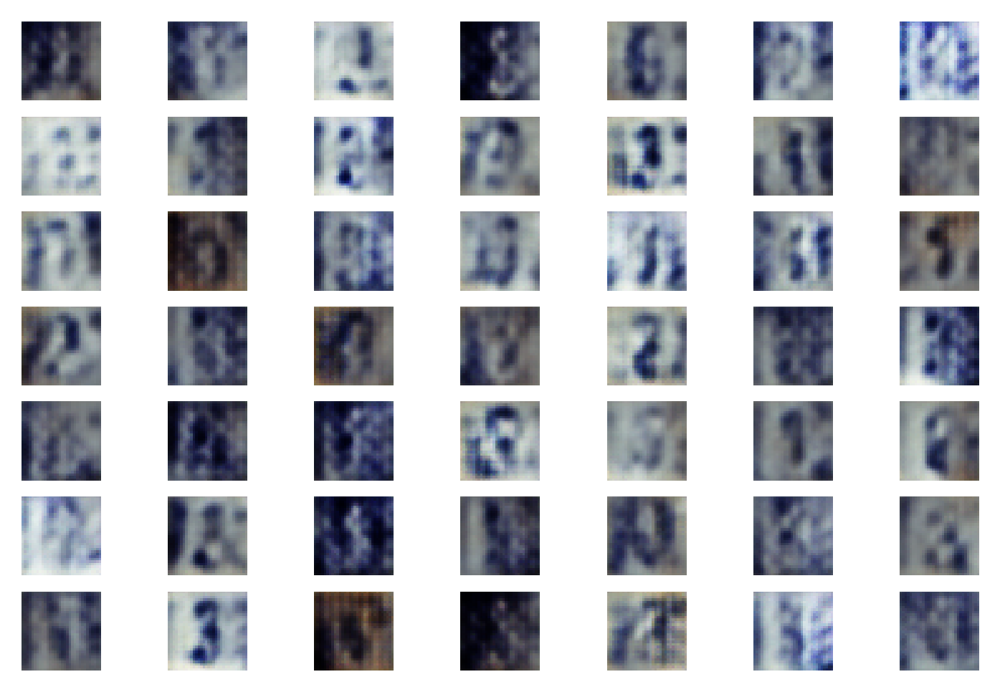

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 3, Batch: 1 of 1144
 Discriminator real loss: 0.6974958777427673, Discriminator Fake loss: 0.6415127515792847, Generator loss: 0.7865498661994934
 Epoch: 3, Batch: 101 of 1144
 Discriminator real loss: 0.36940693855285645, Discriminator Fake loss: 0.6098167896270752, Generator loss: 0.9239381551742554
 Epoch: 3, Batch: 201 of 1144
 Discriminator real loss: 0.5601762533187866, Discriminator Fake loss: 0.6661666035652161, Generator loss: 0.7975872755050659
 Epoch: 3, Batch: 301 of 1144
 Discriminator real loss: 0.8752620816230774, Discriminator Fake loss: 0.586398720741272, Generator loss: 1.0516620874404907
 Epoch: 3, Batch: 401 of 1144
 Discriminator real loss: 0.6269866824150085, Discriminator Fake loss: 0.5920518636703491, Generator loss: 1.0448799133300781
 Epoch: 3, Batch: 501 of 1144
 Discriminator real loss: 0.6824097633361816, Discriminator Fake loss: 0.5668559074401855, Generator loss: 0.94029301404953
 Epoch: 3, Batch: 601 of 1144
 Discriminator real loss: 0.6320184469

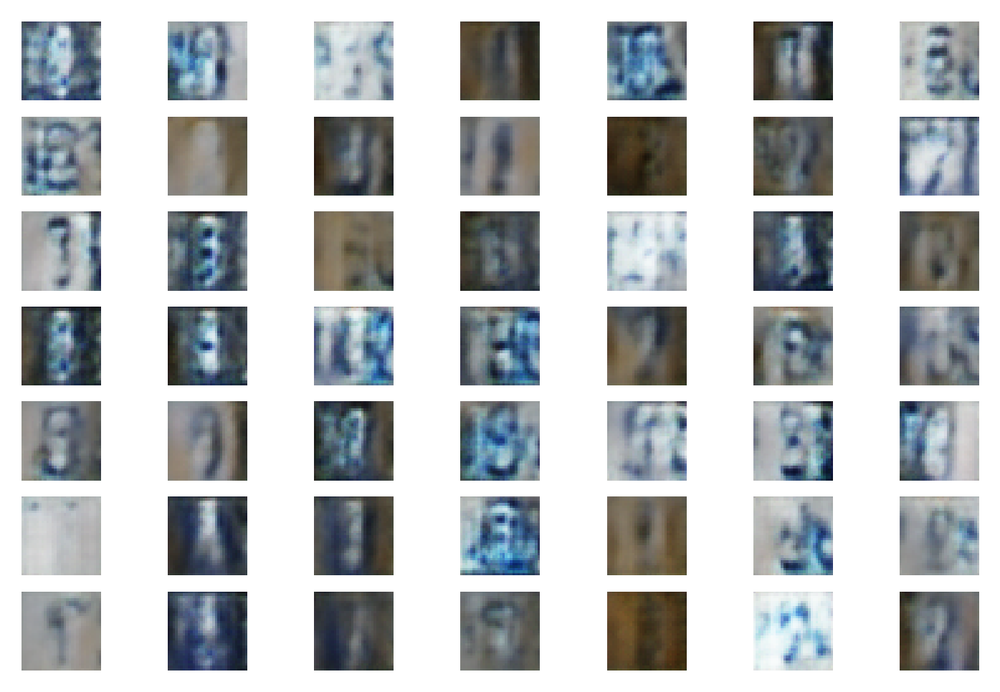

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 4, Batch: 1 of 1144
 Discriminator real loss: 0.660099983215332, Discriminator Fake loss: 0.6694059371948242, Generator loss: 0.775238573551178
 Epoch: 4, Batch: 101 of 1144
 Discriminator real loss: 0.720160961151123, Discriminator Fake loss: 0.6988906860351562, Generator loss: 0.8397009372711182
 Epoch: 4, Batch: 201 of 1144
 Discriminator real loss: 0.6526526808738708, Discriminator Fake loss: 0.7102422714233398, Generator loss: 0.7558397650718689
 Epoch: 4, Batch: 301 of 1144
 Discriminator real loss: 0.7804511189460754, Discriminator Fake loss: 0.6733837723731995, Generator loss: 0.7751859426498413
 Epoch: 4, Batch: 401 of 1144
 Discriminator real loss: 0.728413462638855, Discriminator Fake loss: 0.6535171270370483, Generator loss: 0.9174996614456177
 Epoch: 4, Batch: 501 of 1144
 Discriminator real loss: 0.4892253577709198, Discriminator Fake loss: 0.6251202821731567, Generator loss: 0.7949573993682861
 Epoch: 4, Batch: 601 of 1144
 Discriminator real loss: 0.551624059677

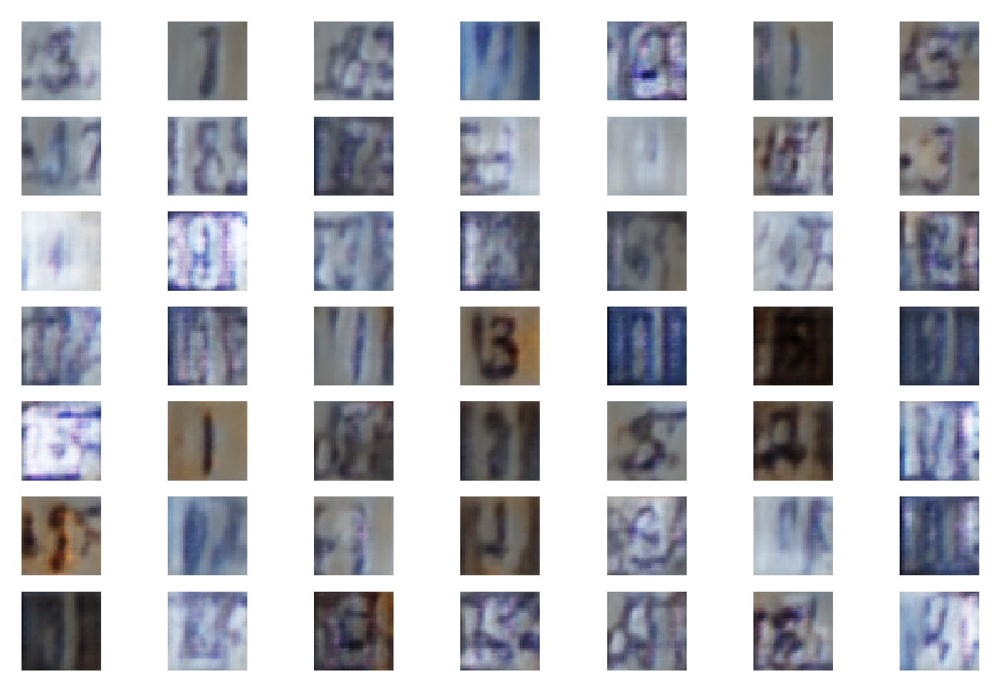

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 5, Batch: 1 of 1144
 Discriminator real loss: 0.6578265428543091, Discriminator Fake loss: 0.6625485420227051, Generator loss: 0.7805278301239014
 Epoch: 5, Batch: 101 of 1144
 Discriminator real loss: 0.6706687211990356, Discriminator Fake loss: 0.6326760053634644, Generator loss: 0.7772513628005981
 Epoch: 5, Batch: 201 of 1144
 Discriminator real loss: 0.5550408363342285, Discriminator Fake loss: 0.7687175869941711, Generator loss: 0.7443955540657043
 Epoch: 5, Batch: 301 of 1144
 Discriminator real loss: 0.717891275882721, Discriminator Fake loss: 0.7672814130783081, Generator loss: 0.7391328811645508
 Epoch: 5, Batch: 401 of 1144
 Discriminator real loss: 0.6796785593032837, Discriminator Fake loss: 0.7259505987167358, Generator loss: 0.7506269216537476
 Epoch: 5, Batch: 501 of 1144
 Discriminator real loss: 0.6974097490310669, Discriminator Fake loss: 0.7471698522567749, Generator loss: 0.749836266040802
 Epoch: 5, Batch: 601 of 1144
 Discriminator real loss: 0.6794846057

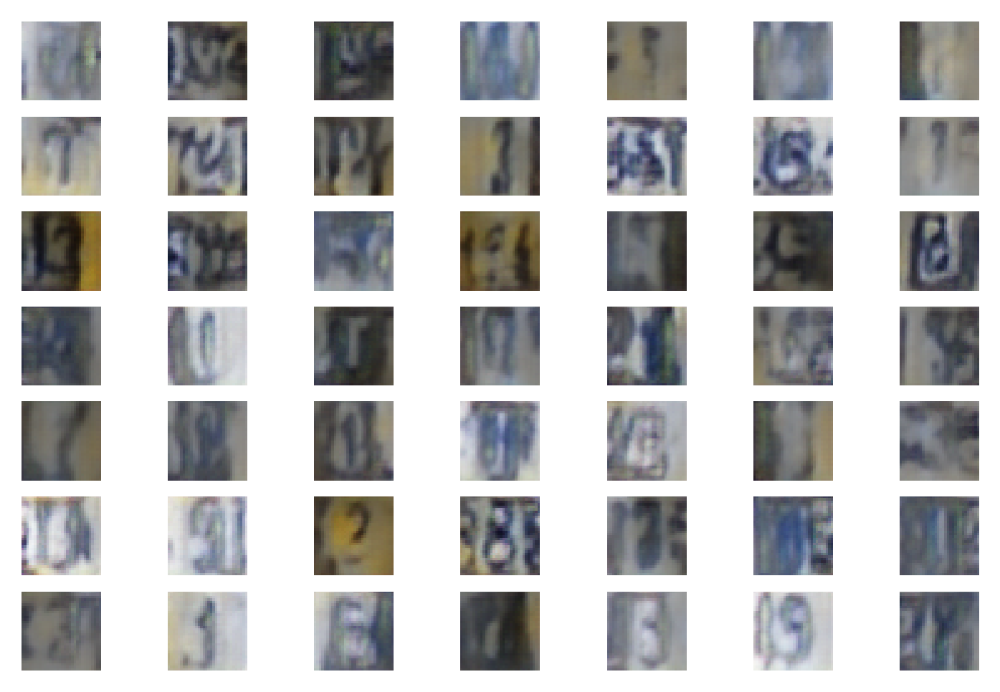

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 6, Batch: 1 of 1144
 Discriminator real loss: 0.6734752655029297, Discriminator Fake loss: 0.6957389712333679, Generator loss: 0.7274974584579468
 Epoch: 6, Batch: 101 of 1144
 Discriminator real loss: 0.5932281017303467, Discriminator Fake loss: 0.692236602306366, Generator loss: 0.7004735469818115
 Epoch: 6, Batch: 201 of 1144
 Discriminator real loss: 0.7316313982009888, Discriminator Fake loss: 0.6524999141693115, Generator loss: 0.7603490948677063
 Epoch: 6, Batch: 301 of 1144
 Discriminator real loss: 0.7081819772720337, Discriminator Fake loss: 0.723468542098999, Generator loss: 0.7179263830184937
 Epoch: 6, Batch: 401 of 1144
 Discriminator real loss: 0.6669713854789734, Discriminator Fake loss: 0.6812301874160767, Generator loss: 0.7171363830566406
 Epoch: 6, Batch: 501 of 1144
 Discriminator real loss: 0.6133068799972534, Discriminator Fake loss: 0.7104849815368652, Generator loss: 0.7188401818275452
 Epoch: 6, Batch: 601 of 1144
 Discriminator real loss: 0.7131675481

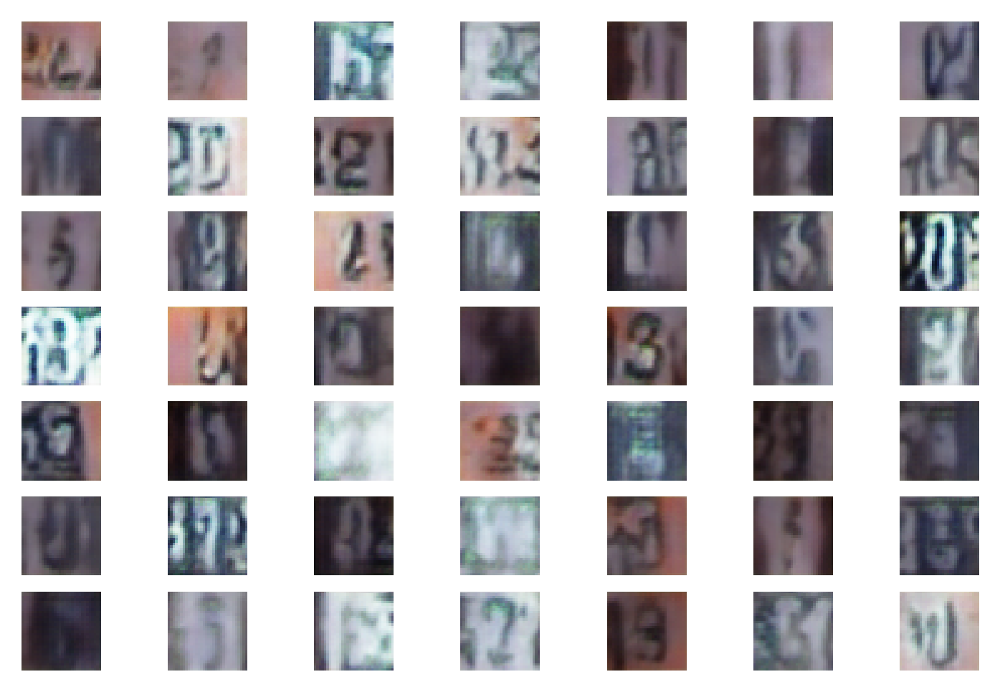

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 7, Batch: 1 of 1144
 Discriminator real loss: 0.6584179401397705, Discriminator Fake loss: 0.6752176880836487, Generator loss: 0.7396117448806763
 Epoch: 7, Batch: 101 of 1144
 Discriminator real loss: 0.7518224716186523, Discriminator Fake loss: 0.6646303534507751, Generator loss: 0.7547184228897095
 Epoch: 7, Batch: 201 of 1144
 Discriminator real loss: 0.6837258338928223, Discriminator Fake loss: 0.6690603494644165, Generator loss: 0.7642877101898193
 Epoch: 7, Batch: 301 of 1144
 Discriminator real loss: 0.6564787030220032, Discriminator Fake loss: 0.7197462320327759, Generator loss: 0.6936684846878052
 Epoch: 7, Batch: 401 of 1144
 Discriminator real loss: 0.657387912273407, Discriminator Fake loss: 0.7193636894226074, Generator loss: 0.7707036733627319
 Epoch: 7, Batch: 501 of 1144
 Discriminator real loss: 0.6760783195495605, Discriminator Fake loss: 0.7010443210601807, Generator loss: 0.7604446411132812
 Epoch: 7, Batch: 601 of 1144
 Discriminator real loss: 0.627905845

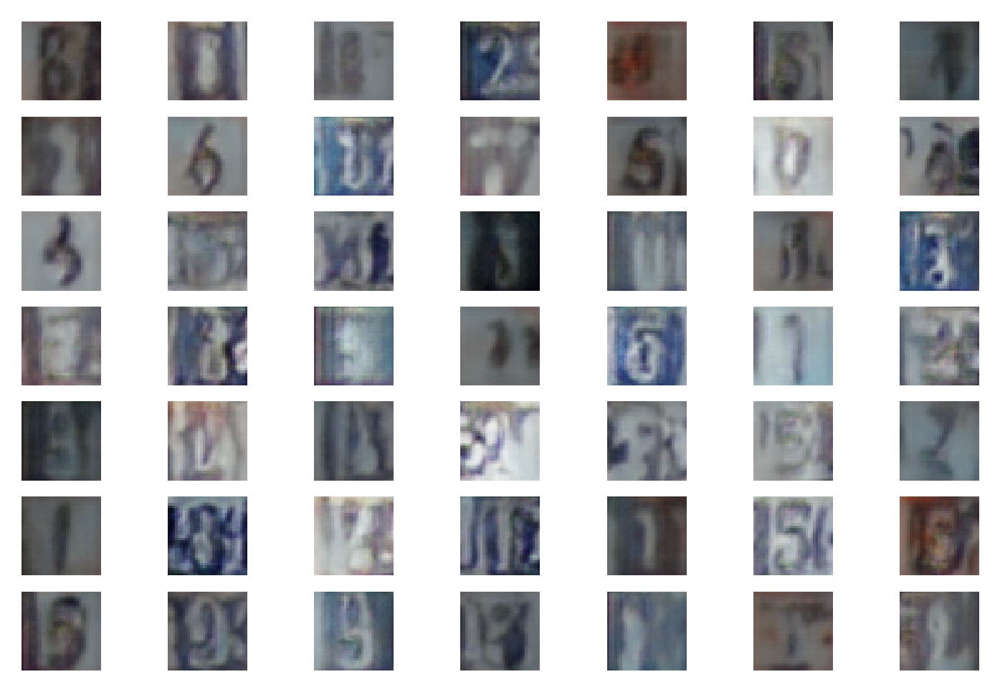

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 8, Batch: 1 of 1144
 Discriminator real loss: 0.6494925022125244, Discriminator Fake loss: 0.6631630659103394, Generator loss: 0.736549973487854
 Epoch: 8, Batch: 101 of 1144
 Discriminator real loss: 0.7085782289505005, Discriminator Fake loss: 0.666073203086853, Generator loss: 0.7201372385025024
 Epoch: 8, Batch: 201 of 1144
 Discriminator real loss: 0.661428689956665, Discriminator Fake loss: 0.7111034989356995, Generator loss: 0.6980156302452087
 Epoch: 8, Batch: 301 of 1144
 Discriminator real loss: 0.6385138630867004, Discriminator Fake loss: 0.611641526222229, Generator loss: 0.8007404804229736
 Epoch: 8, Batch: 401 of 1144
 Discriminator real loss: 0.5952473282814026, Discriminator Fake loss: 0.7010942101478577, Generator loss: 0.6885331273078918
 Epoch: 8, Batch: 501 of 1144
 Discriminator real loss: 0.6990386843681335, Discriminator Fake loss: 0.6453247666358948, Generator loss: 0.7223408222198486
 Epoch: 8, Batch: 601 of 1144
 Discriminator real loss: 0.668245196342

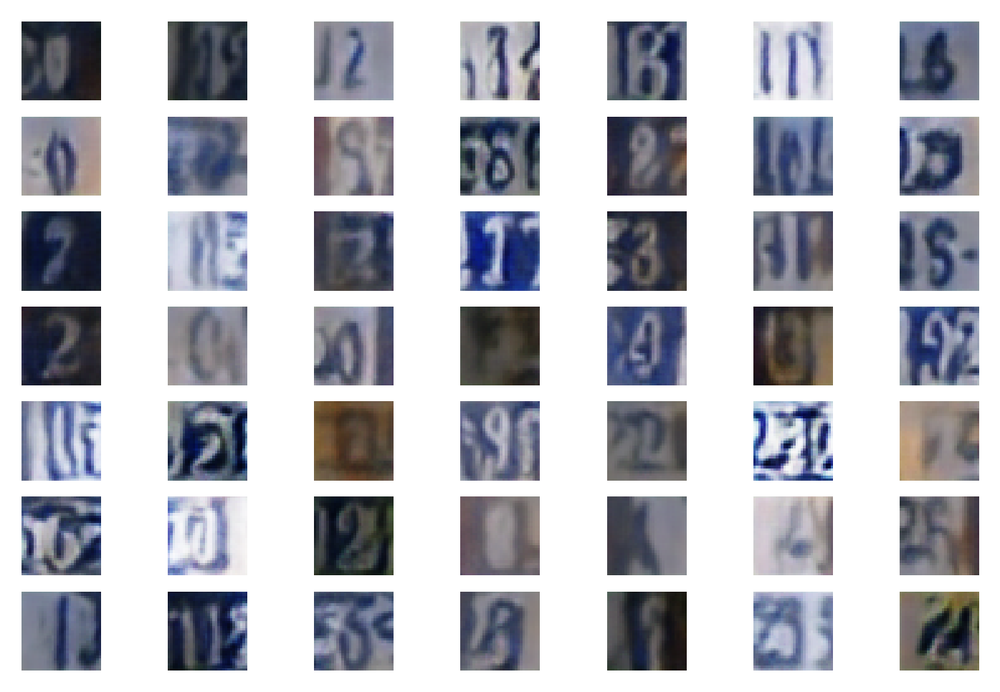

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 9, Batch: 1 of 1144
 Discriminator real loss: 0.6587082743644714, Discriminator Fake loss: 0.6382725834846497, Generator loss: 0.7815214395523071
 Epoch: 9, Batch: 101 of 1144
 Discriminator real loss: 0.6711282134056091, Discriminator Fake loss: 0.6893746852874756, Generator loss: 0.7148211002349854
 Epoch: 9, Batch: 201 of 1144
 Discriminator real loss: 0.6800833940505981, Discriminator Fake loss: 0.7068622708320618, Generator loss: 0.7166728973388672
 Epoch: 9, Batch: 301 of 1144
 Discriminator real loss: 0.6903259754180908, Discriminator Fake loss: 0.6698618531227112, Generator loss: 0.7055541276931763
 Epoch: 9, Batch: 401 of 1144
 Discriminator real loss: 0.6662532091140747, Discriminator Fake loss: 0.6741310358047485, Generator loss: 0.7559348940849304
 Epoch: 9, Batch: 501 of 1144
 Discriminator real loss: 0.6854804754257202, Discriminator Fake loss: 0.6838123202323914, Generator loss: 0.758192777633667
 Epoch: 9, Batch: 601 of 1144
 Discriminator real loss: 0.683665394

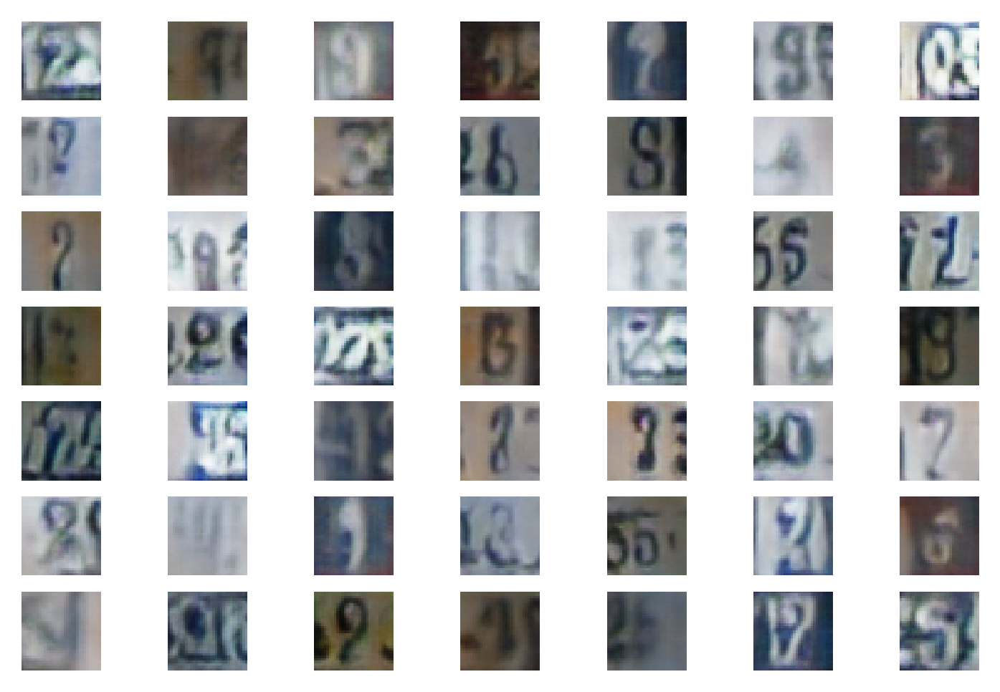

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


  0%|          | 0/1144 [00:00<?, ?it/s]

 Epoch: 10, Batch: 1 of 1144
 Discriminator real loss: 0.6687463521957397, Discriminator Fake loss: 0.6811521053314209, Generator loss: 0.7607676982879639
 Epoch: 10, Batch: 101 of 1144
 Discriminator real loss: 0.7003751397132874, Discriminator Fake loss: 0.6647112369537354, Generator loss: 0.7245035767555237
 Epoch: 10, Batch: 201 of 1144
 Discriminator real loss: 0.6449315547943115, Discriminator Fake loss: 0.7394731640815735, Generator loss: 0.7128458023071289
 Epoch: 10, Batch: 301 of 1144
 Discriminator real loss: 0.711903989315033, Discriminator Fake loss: 0.6683421730995178, Generator loss: 0.7222862243652344
 Epoch: 10, Batch: 401 of 1144
 Discriminator real loss: 0.6674436330795288, Discriminator Fake loss: 0.6892687082290649, Generator loss: 0.7167152166366577
 Epoch: 10, Batch: 501 of 1144
 Discriminator real loss: 0.7032610177993774, Discriminator Fake loss: 0.6722984313964844, Generator loss: 0.7452574968338013
 Epoch: 10, Batch: 601 of 1144
 Discriminator real loss: 0.65

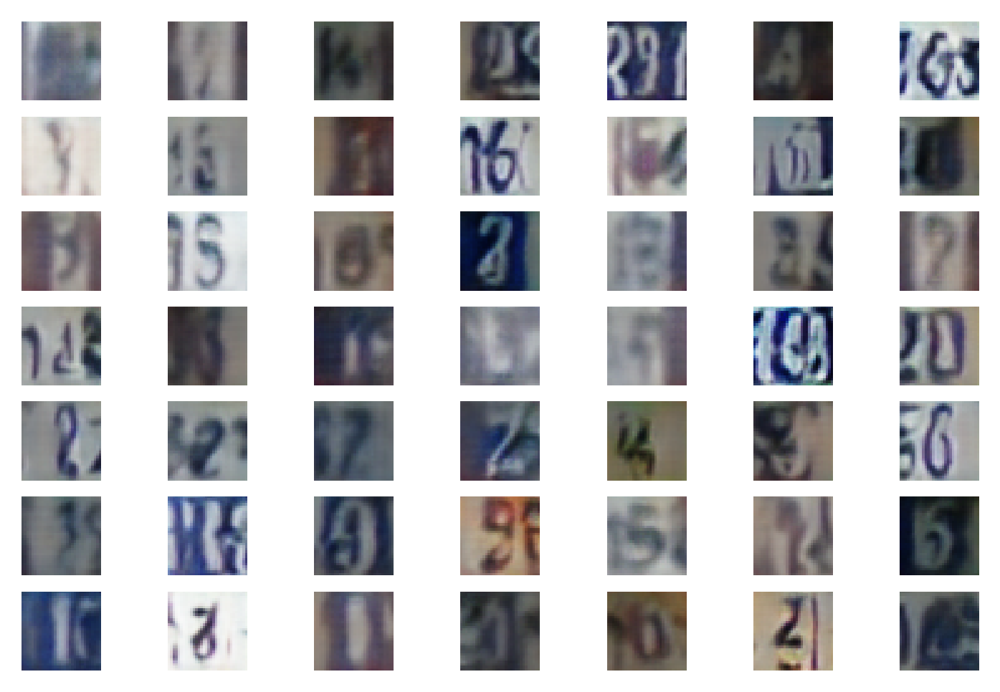

INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_SVHN_NOBN/discriminator/assets


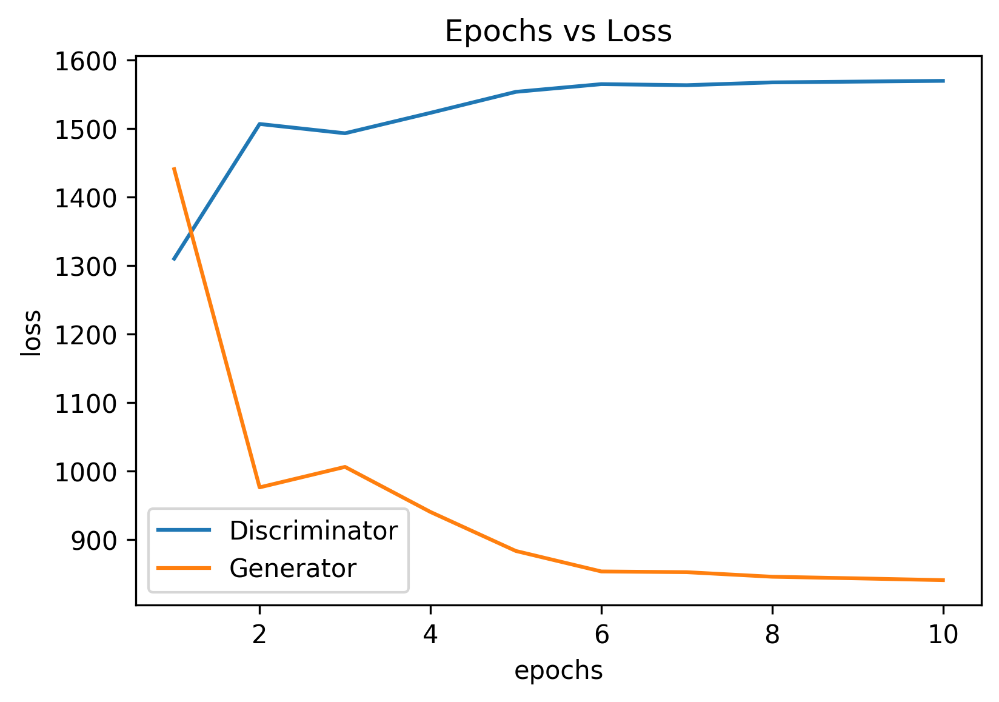

Done with training the model ......
CPU times: user 13min 44s, sys: 59.7 s, total: 14min 44s
Wall time: 25min 21s


In [6]:
%%time
# size of the latent space
samplesize = 100


# create the discriminator
discriminator = discriminator_(in_shape=(32,32,3), 
                               d_lr=0.0002,
                               d_beta=0.5)
# create the generator
generator = generator_(samplesize)
# create the gan
dcgan = dcgan_(generator, discriminator)

# train model
trained_generator = train(generator, discriminator, dcgan, X_train, samplesize, epochs=10, batch_size=64, model_name="DCGAN_SVHN_NOBN")

In [7]:

# image_list =sorted(glob.glob('results/dcgan_cifar/eval_*'), key=lambda x:float(re.findall("(\d+)",x)[0]))
generate_video("DCGAN_SVHN_NOBN")
# imageio.mimwrite('animated_from_images.gif', image_list)
# image_list

Epoch evolutions video saved as results/DCGAN_SVHN_NOBN/outputs_evolution.avi


## DCGAN - No Batch Norm, More Epochs

 Training DCGAN_CELEBA_NOBN_40Epochs ......
Generator Flowchart:
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Generator Summary:
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 4096)              413696    
_________________________________________________________________
leaky_re_lu_28 (LeakyReLU)   (None, 4096)              0         
_________________________________________________________________
reshape_3 (Reshape)          (None, 4, 4, 256)         0         
_________________________________________________________________
conv2d_transpose_9 (Conv2DTr (None, 8, 8, 128)         524416    
_________________________________________________________________
leaky_re_lu_29 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_transpos

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 1, Batch: 1 of 572
 Discriminator real loss: 0.6987257599830627, Discriminator Fake loss: 0.6956685781478882, Generator loss: 0.6914214491844177
 Epoch: 1, Batch: 101 of 572
 Discriminator real loss: 0.7111915349960327, Discriminator Fake loss: 0.16768479347229004, Generator loss: 2.3689424991607666
 Epoch: 1, Batch: 201 of 572
 Discriminator real loss: 0.3547145128250122, Discriminator Fake loss: 0.7198121547698975, Generator loss: 0.9533149003982544
 Epoch: 1, Batch: 301 of 572
 Discriminator real loss: 0.7137027382850647, Discriminator Fake loss: 0.6409143209457397, Generator loss: 1.3819273710250854
 Epoch: 1, Batch: 401 of 572
 Discriminator real loss: 0.6615003347396851, Discriminator Fake loss: 0.4327874779701233, Generator loss: 1.3577501773834229
 Epoch: 1, Batch: 501 of 572
 Discriminator real loss: 0.7440540790557861, Discriminator Fake loss: 0.5669365525245667, Generator loss: 0.8908411264419556
***** Accuracy real: 75.99999904632568, fake: 77.99999713897705 *****


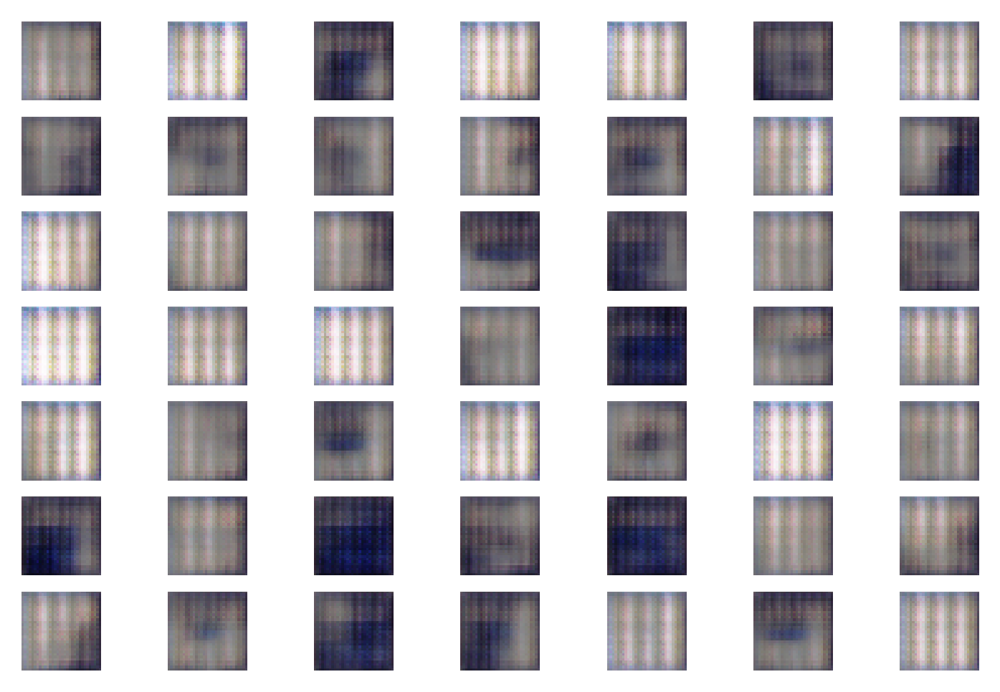

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 2, Batch: 1 of 572
 Discriminator real loss: 0.5162995457649231, Discriminator Fake loss: 0.5671829581260681, Generator loss: 1.5203887224197388
 Epoch: 2, Batch: 101 of 572
 Discriminator real loss: 0.32834404706954956, Discriminator Fake loss: 0.6942817568778992, Generator loss: 0.8383119106292725
 Epoch: 2, Batch: 201 of 572
 Discriminator real loss: 0.5162222385406494, Discriminator Fake loss: 0.6219320297241211, Generator loss: 0.8693890571594238
 Epoch: 2, Batch: 301 of 572
 Discriminator real loss: 0.6472029685974121, Discriminator Fake loss: 0.5466667413711548, Generator loss: 1.0097415447235107
 Epoch: 2, Batch: 401 of 572
 Discriminator real loss: 0.6355308294296265, Discriminator Fake loss: 0.6408052444458008, Generator loss: 0.9182032942771912
 Epoch: 2, Batch: 501 of 572
 Discriminator real loss: 0.5435518026351929, Discriminator Fake loss: 0.6025316715240479, Generator loss: 1.0327415466308594
***** Accuracy real: 59.333330392837524, fake: 77.99999713897705 *****


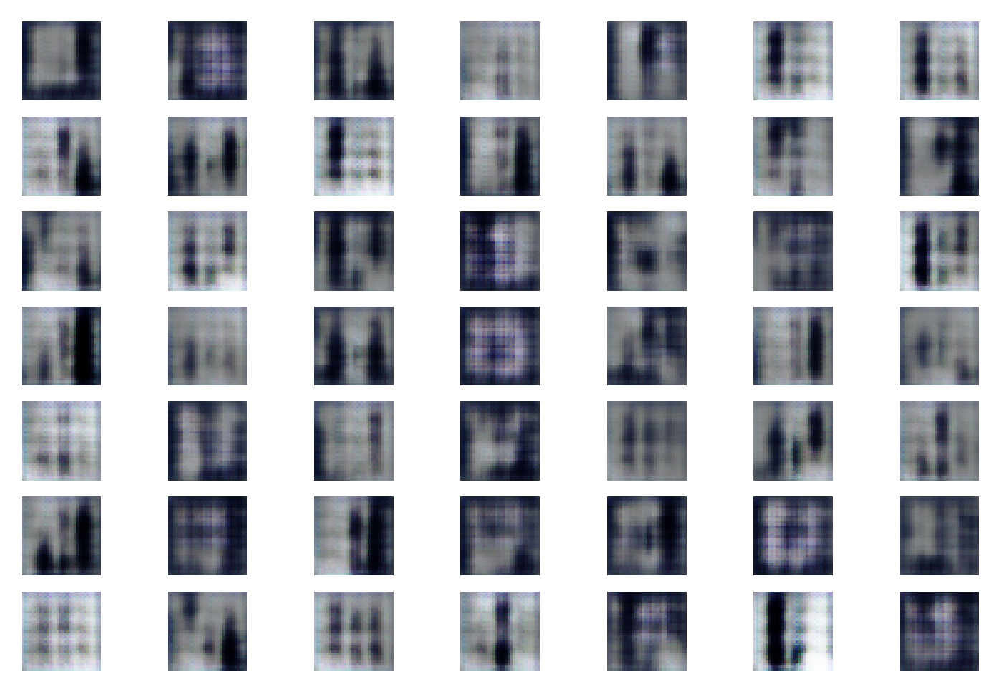

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 3, Batch: 1 of 572
 Discriminator real loss: 0.6082792282104492, Discriminator Fake loss: 0.6438635587692261, Generator loss: 0.8935530185699463
 Epoch: 3, Batch: 101 of 572
 Discriminator real loss: 0.7349429130554199, Discriminator Fake loss: 0.5081091523170471, Generator loss: 1.149298906326294
 Epoch: 3, Batch: 201 of 572
 Discriminator real loss: 0.41405102610588074, Discriminator Fake loss: 0.5292955636978149, Generator loss: 1.2823939323425293
 Epoch: 3, Batch: 301 of 572
 Discriminator real loss: 0.32289668917655945, Discriminator Fake loss: 0.3317309617996216, Generator loss: 1.5485079288482666
 Epoch: 3, Batch: 401 of 572
 Discriminator real loss: 0.6137258410453796, Discriminator Fake loss: 0.5917468667030334, Generator loss: 1.0354647636413574
 Epoch: 3, Batch: 501 of 572
 Discriminator real loss: 0.6166341304779053, Discriminator Fake loss: 0.5674527883529663, Generator loss: 0.9645097851753235
***** Accuracy real: 49.33333396911621, fake: 82.66666531562805 *****


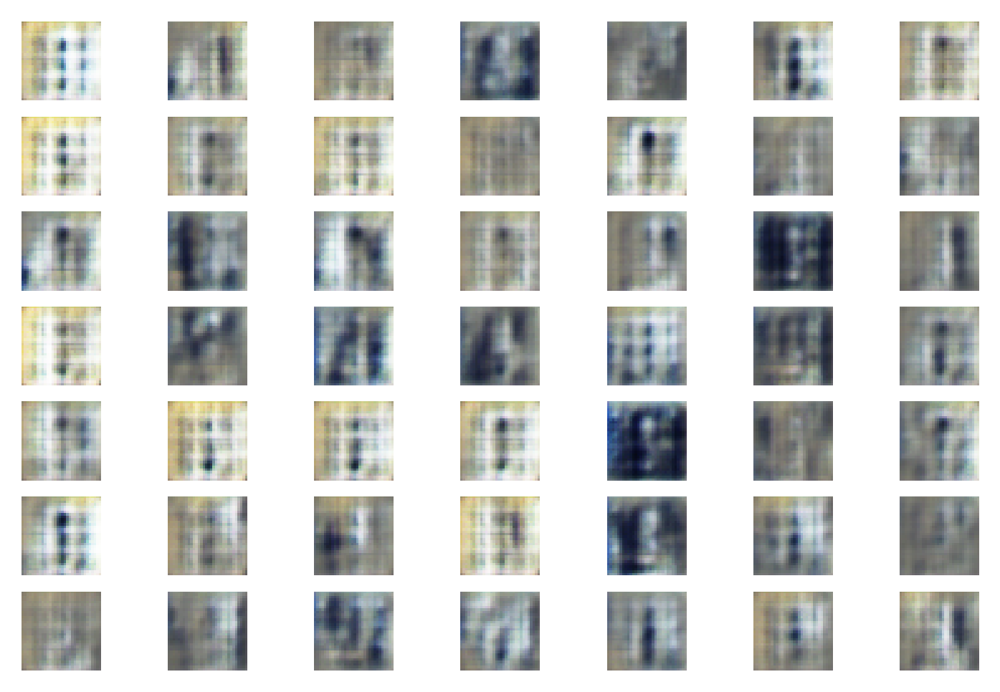

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 4, Batch: 1 of 572
 Discriminator real loss: 0.5507811307907104, Discriminator Fake loss: 0.454024076461792, Generator loss: 1.3158979415893555
 Epoch: 4, Batch: 101 of 572
 Discriminator real loss: 0.7240325212478638, Discriminator Fake loss: 0.6645412445068359, Generator loss: 0.8866972923278809
 Epoch: 4, Batch: 201 of 572
 Discriminator real loss: 0.6176368594169617, Discriminator Fake loss: 0.628571629524231, Generator loss: 0.8706659078598022
 Epoch: 4, Batch: 301 of 572
 Discriminator real loss: 0.6239465475082397, Discriminator Fake loss: 0.7324987649917603, Generator loss: 0.7628470659255981
 Epoch: 4, Batch: 401 of 572
 Discriminator real loss: 0.5922269821166992, Discriminator Fake loss: 0.599743664264679, Generator loss: 0.8639836311340332
 Epoch: 4, Batch: 501 of 572
 Discriminator real loss: 0.7044178247451782, Discriminator Fake loss: 0.6066677570343018, Generator loss: 0.8246109485626221
***** Accuracy real: 61.33333444595337, fake: 87.33333349227905 *****


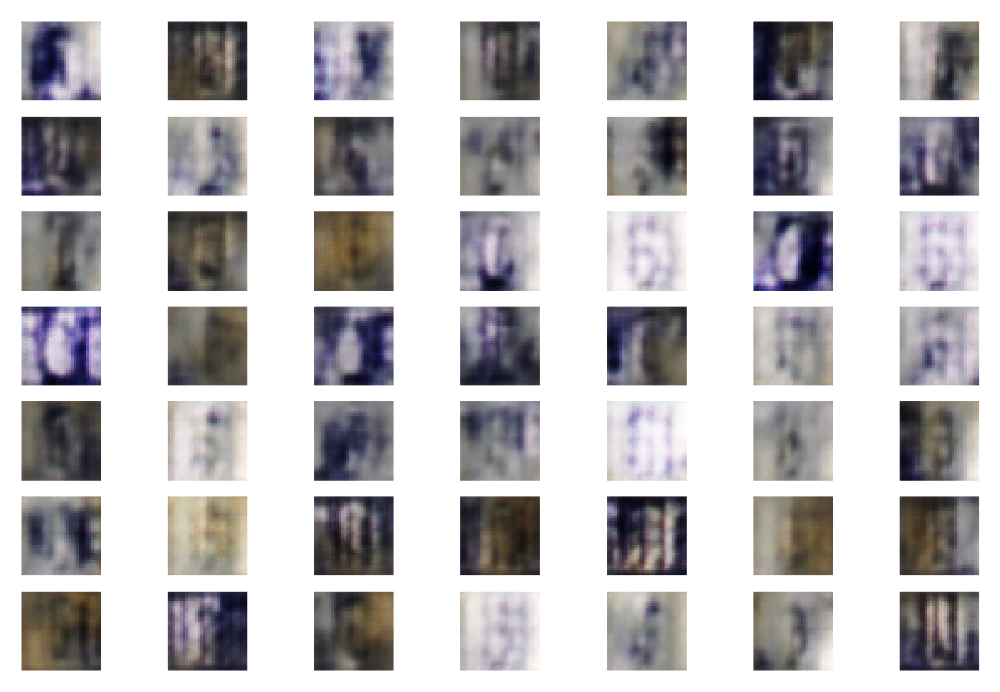

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 5, Batch: 1 of 572
 Discriminator real loss: 0.6073347330093384, Discriminator Fake loss: 0.6378446221351624, Generator loss: 0.8275381326675415
 Epoch: 5, Batch: 101 of 572
 Discriminator real loss: 0.6941208839416504, Discriminator Fake loss: 0.6118327379226685, Generator loss: 0.8202130794525146
 Epoch: 5, Batch: 201 of 572
 Discriminator real loss: 0.6901873350143433, Discriminator Fake loss: 0.6583981513977051, Generator loss: 0.8061299324035645
 Epoch: 5, Batch: 301 of 572
 Discriminator real loss: 0.5740174055099487, Discriminator Fake loss: 0.673658013343811, Generator loss: 0.772494912147522
 Epoch: 5, Batch: 401 of 572
 Discriminator real loss: 0.6440209150314331, Discriminator Fake loss: 0.6480993032455444, Generator loss: 0.9272011518478394
 Epoch: 5, Batch: 501 of 572
 Discriminator real loss: 0.5995614528656006, Discriminator Fake loss: 0.5900745987892151, Generator loss: 0.9552263021469116
***** Accuracy real: 69.33333277702332, fake: 78.66666913032532 *****


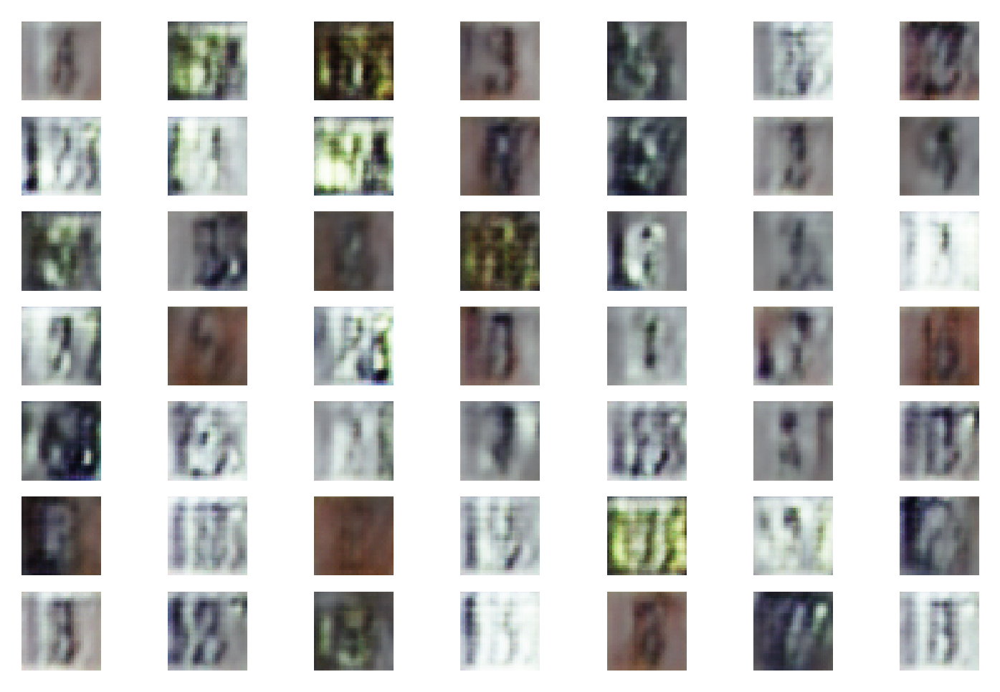

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 6, Batch: 1 of 572
 Discriminator real loss: 0.6104863286018372, Discriminator Fake loss: 0.6577619314193726, Generator loss: 0.8448651432991028
 Epoch: 6, Batch: 101 of 572
 Discriminator real loss: 0.7029134035110474, Discriminator Fake loss: 0.6661034822463989, Generator loss: 0.7960261106491089
 Epoch: 6, Batch: 201 of 572
 Discriminator real loss: 0.651899516582489, Discriminator Fake loss: 0.7781248092651367, Generator loss: 0.703078031539917
 Epoch: 6, Batch: 301 of 572
 Discriminator real loss: 0.7556277513504028, Discriminator Fake loss: 0.6468827724456787, Generator loss: 0.8517188429832458
 Epoch: 6, Batch: 401 of 572
 Discriminator real loss: 0.7724752426147461, Discriminator Fake loss: 0.6283280253410339, Generator loss: 0.8779077529907227
 Epoch: 6, Batch: 501 of 572
 Discriminator real loss: 0.6480329036712646, Discriminator Fake loss: 0.5665814280509949, Generator loss: 0.9321750998497009
***** Accuracy real: 51.33333206176758, fake: 78.66666913032532 *****


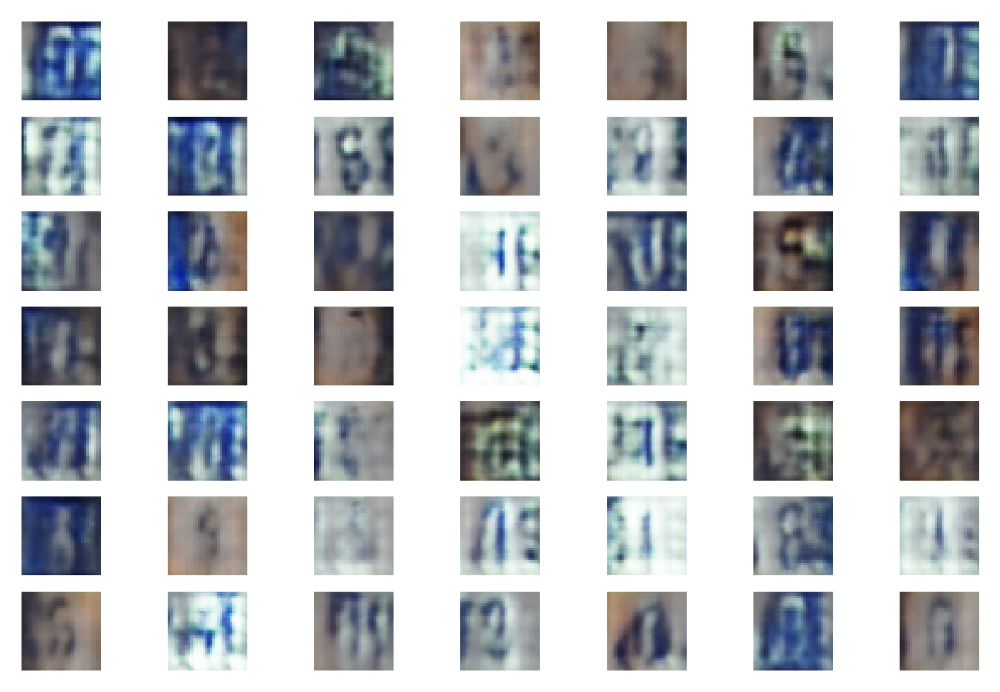

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 7, Batch: 1 of 572
 Discriminator real loss: 0.634626567363739, Discriminator Fake loss: 0.6087144613265991, Generator loss: 0.8441518545150757
 Epoch: 7, Batch: 101 of 572
 Discriminator real loss: 0.6441227197647095, Discriminator Fake loss: 0.6208145618438721, Generator loss: 0.8085408806800842
 Epoch: 7, Batch: 201 of 572
 Discriminator real loss: 0.6591228246688843, Discriminator Fake loss: 0.6380744576454163, Generator loss: 0.8637276887893677
 Epoch: 7, Batch: 301 of 572
 Discriminator real loss: 0.5977372527122498, Discriminator Fake loss: 0.6585543155670166, Generator loss: 0.8228471279144287
 Epoch: 7, Batch: 401 of 572
 Discriminator real loss: 0.5782126188278198, Discriminator Fake loss: 0.660271942615509, Generator loss: 0.7589744329452515
 Epoch: 7, Batch: 501 of 572
 Discriminator real loss: 0.6456792950630188, Discriminator Fake loss: 0.6824479699134827, Generator loss: 0.8268784284591675
***** Accuracy real: 54.00000214576721, fake: 84.6666693687439 *****


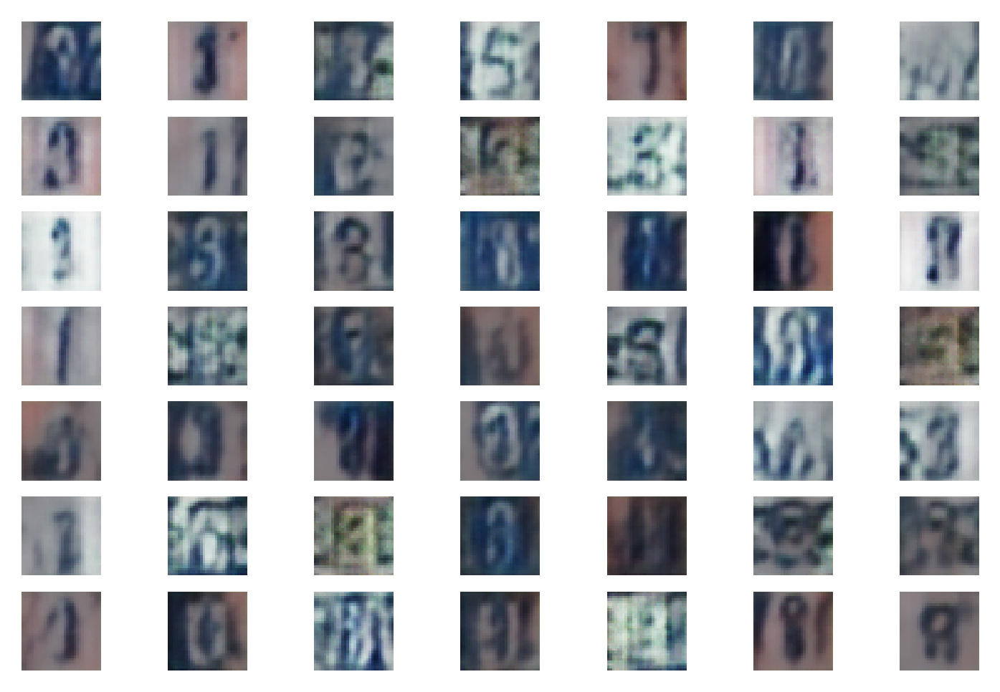

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 8, Batch: 1 of 572
 Discriminator real loss: 0.6154030561447144, Discriminator Fake loss: 0.6815429925918579, Generator loss: 0.8698491454124451
 Epoch: 8, Batch: 101 of 572
 Discriminator real loss: 0.6474533081054688, Discriminator Fake loss: 0.7142932415008545, Generator loss: 0.7439026832580566
 Epoch: 8, Batch: 201 of 572
 Discriminator real loss: 0.6289588212966919, Discriminator Fake loss: 0.646756649017334, Generator loss: 0.8947250843048096
 Epoch: 8, Batch: 301 of 572
 Discriminator real loss: 0.7045296430587769, Discriminator Fake loss: 0.6538217663764954, Generator loss: 0.8271804451942444
 Epoch: 8, Batch: 401 of 572
 Discriminator real loss: 0.7179982662200928, Discriminator Fake loss: 0.6951347589492798, Generator loss: 0.8549419045448303
 Epoch: 8, Batch: 501 of 572
 Discriminator real loss: 0.6435028314590454, Discriminator Fake loss: 0.6661138534545898, Generator loss: 0.781552255153656
***** Accuracy real: 65.3333306312561, fake: 62.66666650772095 *****


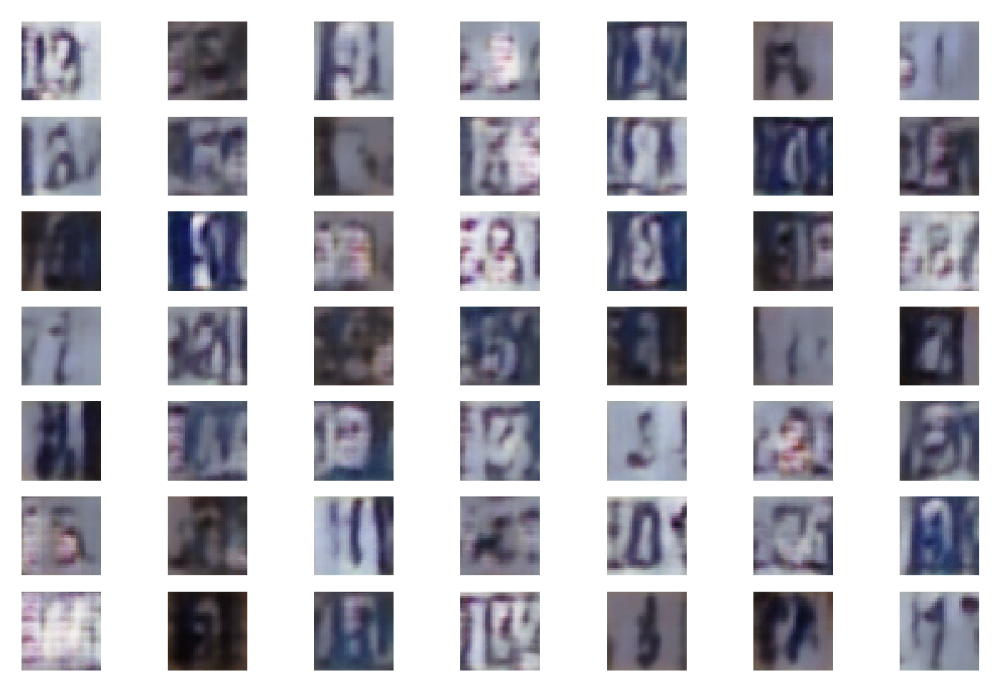

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 9, Batch: 1 of 572
 Discriminator real loss: 0.6490673422813416, Discriminator Fake loss: 0.6651722192764282, Generator loss: 0.7835121154785156
 Epoch: 9, Batch: 101 of 572
 Discriminator real loss: 0.7143864631652832, Discriminator Fake loss: 0.5778551697731018, Generator loss: 0.8944553732872009
 Epoch: 9, Batch: 201 of 572
 Discriminator real loss: 0.6205570697784424, Discriminator Fake loss: 0.6756278872489929, Generator loss: 0.764630138874054
 Epoch: 9, Batch: 301 of 572
 Discriminator real loss: 0.6949107646942139, Discriminator Fake loss: 0.6617971658706665, Generator loss: 0.8711878061294556
 Epoch: 9, Batch: 401 of 572
 Discriminator real loss: 0.6196672916412354, Discriminator Fake loss: 0.651807963848114, Generator loss: 0.8019806146621704
 Epoch: 9, Batch: 501 of 572
 Discriminator real loss: 0.6881061792373657, Discriminator Fake loss: 0.6449525356292725, Generator loss: 0.7782482504844666
***** Accuracy real: 41.333332657814026, fake: 82.66666531562805 *****


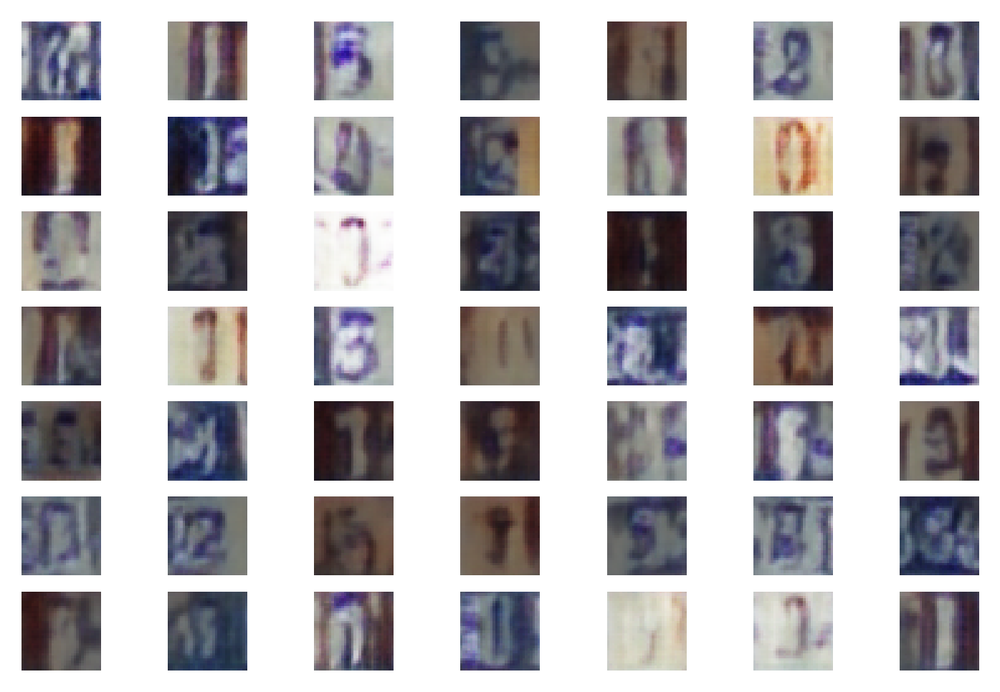

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 10, Batch: 1 of 572
 Discriminator real loss: 0.6344884634017944, Discriminator Fake loss: 0.6124385595321655, Generator loss: 0.8121662139892578
 Epoch: 10, Batch: 101 of 572
 Discriminator real loss: 0.7284736633300781, Discriminator Fake loss: 0.6455739736557007, Generator loss: 0.8228577971458435
 Epoch: 10, Batch: 201 of 572
 Discriminator real loss: 0.7055796384811401, Discriminator Fake loss: 0.6245949268341064, Generator loss: 0.8245483636856079
 Epoch: 10, Batch: 301 of 572
 Discriminator real loss: 0.6713886260986328, Discriminator Fake loss: 0.652945876121521, Generator loss: 0.8156250715255737
 Epoch: 10, Batch: 401 of 572
 Discriminator real loss: 0.718029260635376, Discriminator Fake loss: 0.6341953277587891, Generator loss: 0.7890490293502808
 Epoch: 10, Batch: 501 of 572
 Discriminator real loss: 0.6699890494346619, Discriminator Fake loss: 0.6948437094688416, Generator loss: 0.7447859048843384
***** Accuracy real: 63.333332538604736, fake: 44.66666579246521 ***

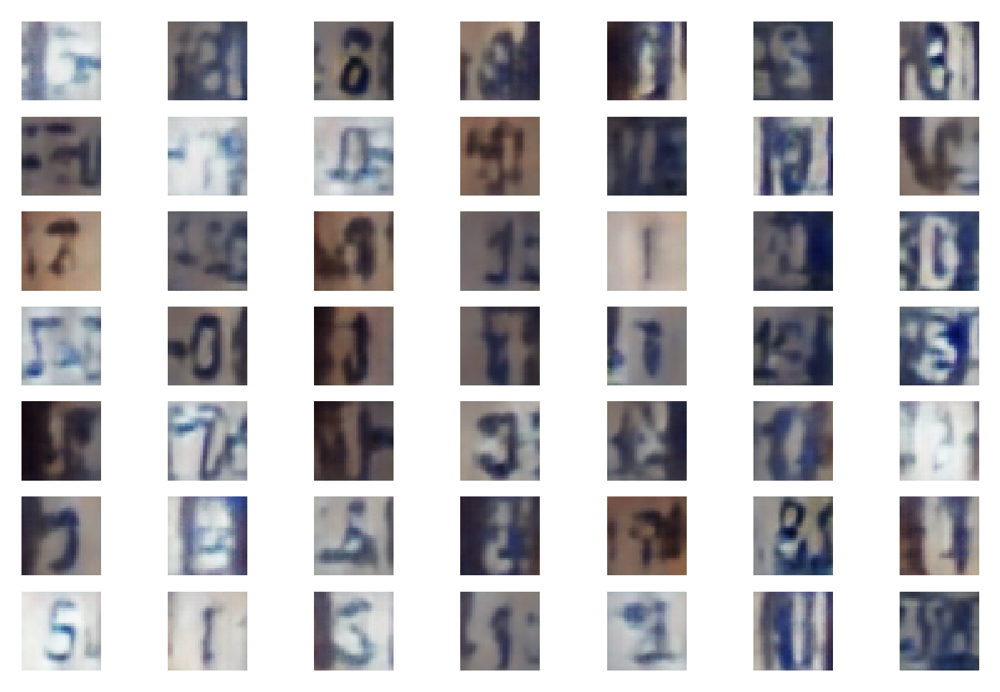

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 11, Batch: 1 of 572
 Discriminator real loss: 0.6974552869796753, Discriminator Fake loss: 0.7866013050079346, Generator loss: 0.7197684049606323
 Epoch: 11, Batch: 101 of 572
 Discriminator real loss: 0.7300147414207458, Discriminator Fake loss: 0.7088042497634888, Generator loss: 0.7699797749519348
 Epoch: 11, Batch: 201 of 572
 Discriminator real loss: 0.6710368394851685, Discriminator Fake loss: 0.6436526775360107, Generator loss: 0.7855066061019897
 Epoch: 11, Batch: 301 of 572
 Discriminator real loss: 0.6655829548835754, Discriminator Fake loss: 0.6373335123062134, Generator loss: 0.804430365562439
 Epoch: 11, Batch: 401 of 572
 Discriminator real loss: 0.647492527961731, Discriminator Fake loss: 0.7061314582824707, Generator loss: 0.7714321613311768
 Epoch: 11, Batch: 501 of 572
 Discriminator real loss: 0.6817679405212402, Discriminator Fake loss: 0.7904247045516968, Generator loss: 0.7728776931762695
***** Accuracy real: 51.99999809265137, fake: 81.33333325386047 ****

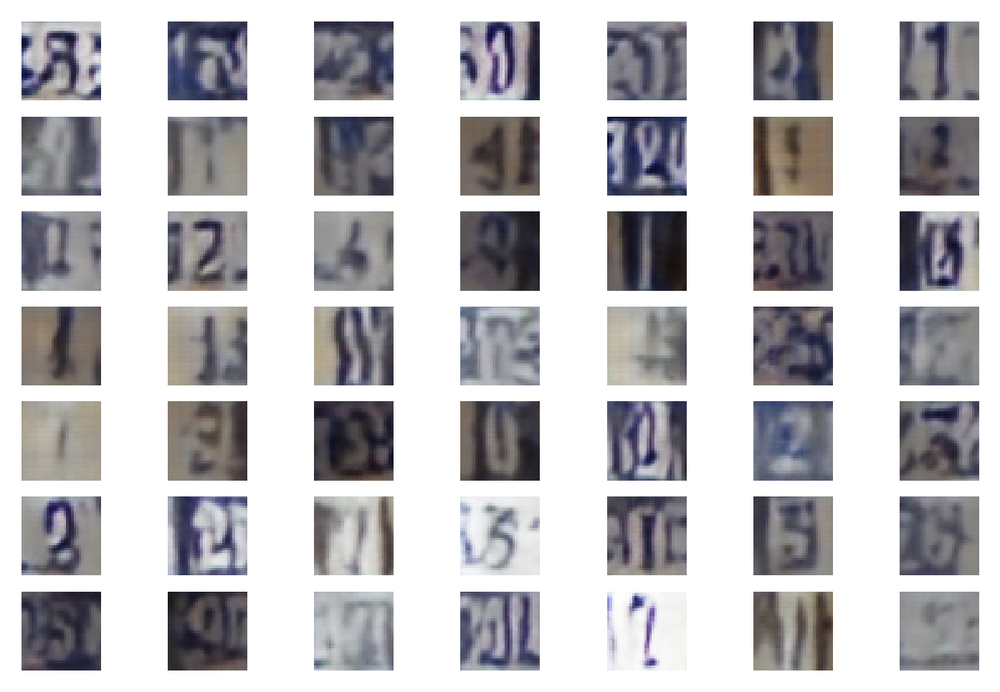

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 12, Batch: 1 of 572
 Discriminator real loss: 0.6731573939323425, Discriminator Fake loss: 0.687013566493988, Generator loss: 0.7700319886207581
 Epoch: 12, Batch: 101 of 572
 Discriminator real loss: 0.6490575075149536, Discriminator Fake loss: 0.7277264595031738, Generator loss: 0.7329946756362915
 Epoch: 12, Batch: 201 of 572
 Discriminator real loss: 0.6683989763259888, Discriminator Fake loss: 0.6952064037322998, Generator loss: 0.7789632081985474
 Epoch: 12, Batch: 301 of 572
 Discriminator real loss: 0.6690571904182434, Discriminator Fake loss: 0.6521791219711304, Generator loss: 0.7660948038101196
 Epoch: 12, Batch: 401 of 572
 Discriminator real loss: 0.6881080269813538, Discriminator Fake loss: 0.6722973585128784, Generator loss: 0.8060997724533081
 Epoch: 12, Batch: 501 of 572
 Discriminator real loss: 0.6877290606498718, Discriminator Fake loss: 0.6744235157966614, Generator loss: 0.7750429511070251
***** Accuracy real: 37.33333349227905, fake: 68.00000071525574 ***

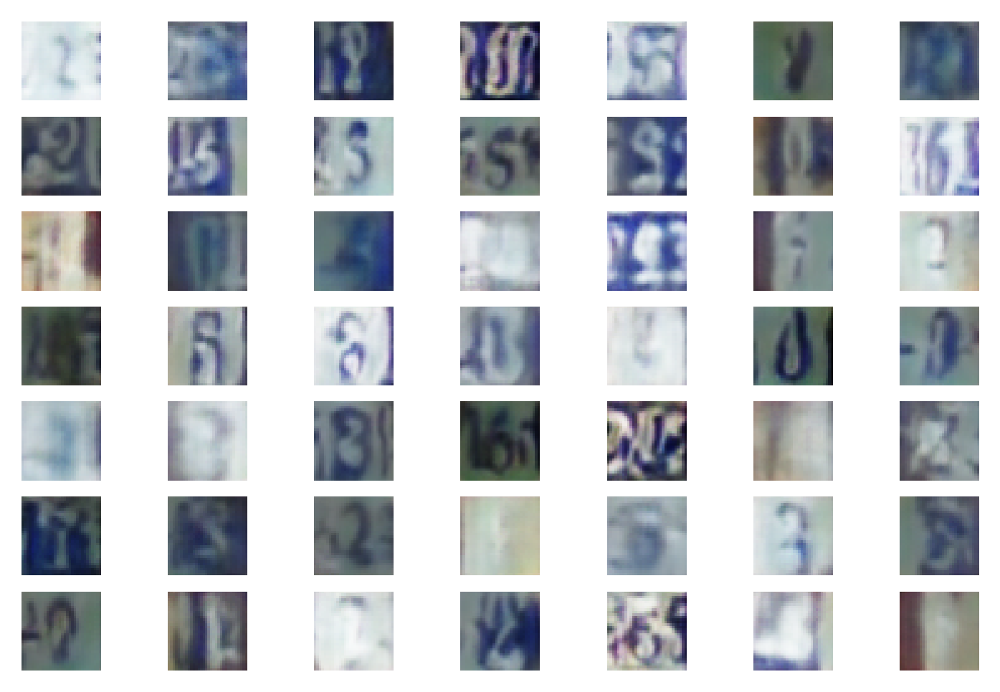

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 13, Batch: 1 of 572
 Discriminator real loss: 0.6754540205001831, Discriminator Fake loss: 0.6818705797195435, Generator loss: 0.7469612956047058
 Epoch: 13, Batch: 101 of 572
 Discriminator real loss: 0.6525180339813232, Discriminator Fake loss: 0.6675776243209839, Generator loss: 0.7402439713478088
 Epoch: 13, Batch: 201 of 572
 Discriminator real loss: 0.6820479035377502, Discriminator Fake loss: 0.6511483192443848, Generator loss: 0.7404975891113281
 Epoch: 13, Batch: 301 of 572
 Discriminator real loss: 0.6240377426147461, Discriminator Fake loss: 0.7066388130187988, Generator loss: 0.7472639083862305
 Epoch: 13, Batch: 401 of 572
 Discriminator real loss: 0.6794171333312988, Discriminator Fake loss: 0.6908978819847107, Generator loss: 0.7713013887405396
 Epoch: 13, Batch: 501 of 572
 Discriminator real loss: 0.6848279237747192, Discriminator Fake loss: 0.7040038108825684, Generator loss: 0.7245186567306519
***** Accuracy real: 44.66666579246521, fake: 73.33333492279053 **

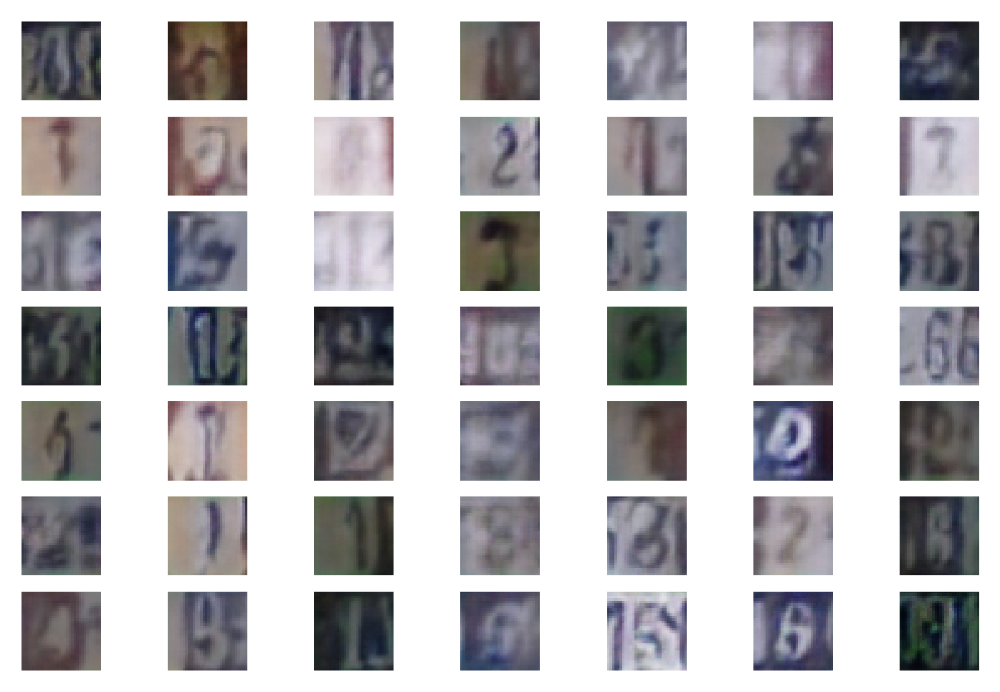

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 14, Batch: 1 of 572
 Discriminator real loss: 0.6630845069885254, Discriminator Fake loss: 0.6947404146194458, Generator loss: 0.7292487025260925
 Epoch: 14, Batch: 101 of 572
 Discriminator real loss: 0.6381466388702393, Discriminator Fake loss: 0.6732826828956604, Generator loss: 0.7333821058273315
 Epoch: 14, Batch: 201 of 572
 Discriminator real loss: 0.6458906531333923, Discriminator Fake loss: 0.6844666004180908, Generator loss: 0.7331485152244568
 Epoch: 14, Batch: 301 of 572
 Discriminator real loss: 0.6970382928848267, Discriminator Fake loss: 0.6760770082473755, Generator loss: 0.7435603141784668
 Epoch: 14, Batch: 401 of 572
 Discriminator real loss: 0.6996583938598633, Discriminator Fake loss: 0.6337655782699585, Generator loss: 0.7857655882835388
 Epoch: 14, Batch: 501 of 572
 Discriminator real loss: 0.6886262893676758, Discriminator Fake loss: 0.6259477138519287, Generator loss: 0.7828869819641113
***** Accuracy real: 41.333332657814026, fake: 74.00000095367432 *

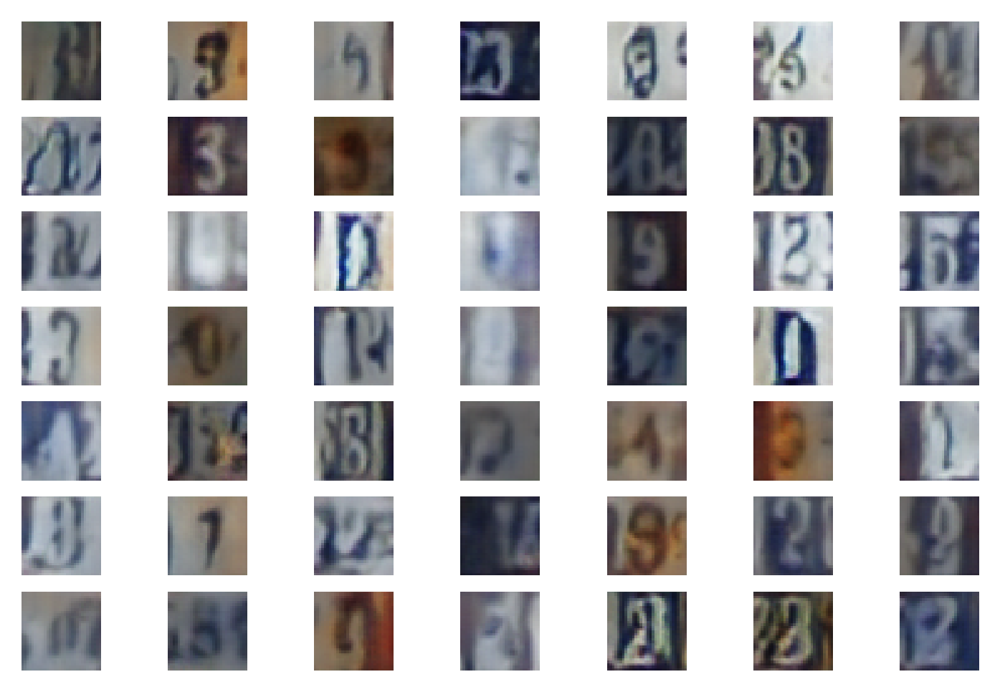

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 15, Batch: 1 of 572
 Discriminator real loss: 0.6685036420822144, Discriminator Fake loss: 0.7209038734436035, Generator loss: 0.7442691326141357
 Epoch: 15, Batch: 101 of 572
 Discriminator real loss: 0.6568902730941772, Discriminator Fake loss: 0.7109036445617676, Generator loss: 0.7246865034103394
 Epoch: 15, Batch: 201 of 572
 Discriminator real loss: 0.7064570188522339, Discriminator Fake loss: 0.6938422322273254, Generator loss: 0.7516545057296753
 Epoch: 15, Batch: 301 of 572
 Discriminator real loss: 0.6797746419906616, Discriminator Fake loss: 0.6886939406394958, Generator loss: 0.7248226404190063
 Epoch: 15, Batch: 401 of 572
 Discriminator real loss: 0.6993183493614197, Discriminator Fake loss: 0.6860747933387756, Generator loss: 0.7345359325408936
 Epoch: 15, Batch: 501 of 572
 Discriminator real loss: 0.6817646026611328, Discriminator Fake loss: 0.6735578775405884, Generator loss: 0.7238436341285706
***** Accuracy real: 55.33333420753479, fake: 78.66666913032532 **

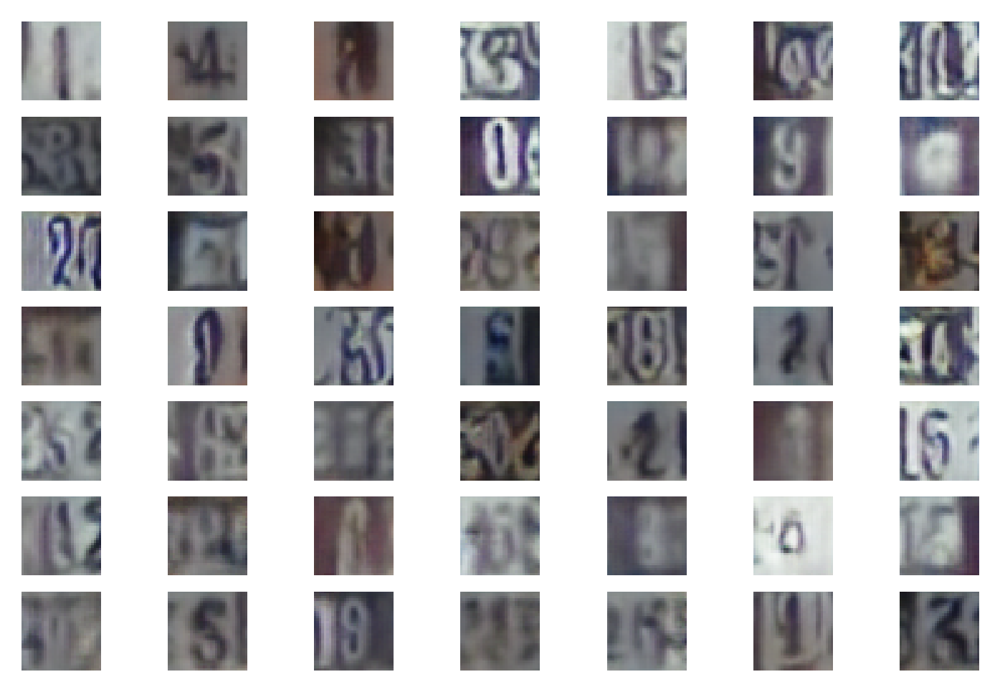

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 16, Batch: 1 of 572
 Discriminator real loss: 0.6686656475067139, Discriminator Fake loss: 0.6763359308242798, Generator loss: 0.7757511138916016
 Epoch: 16, Batch: 101 of 572
 Discriminator real loss: 0.7128781676292419, Discriminator Fake loss: 0.6884726881980896, Generator loss: 0.7487468719482422
 Epoch: 16, Batch: 201 of 572
 Discriminator real loss: 0.7174229025840759, Discriminator Fake loss: 0.6617413759231567, Generator loss: 0.7376288175582886
 Epoch: 16, Batch: 301 of 572
 Discriminator real loss: 0.6946406960487366, Discriminator Fake loss: 0.6721000671386719, Generator loss: 0.7521461248397827
 Epoch: 16, Batch: 401 of 572
 Discriminator real loss: 0.6932398676872253, Discriminator Fake loss: 0.7033730745315552, Generator loss: 0.7049890160560608
 Epoch: 16, Batch: 501 of 572
 Discriminator real loss: 0.7176441550254822, Discriminator Fake loss: 0.7298862934112549, Generator loss: 0.7361260652542114
***** Accuracy real: 41.333332657814026, fake: 77.99999713897705 *

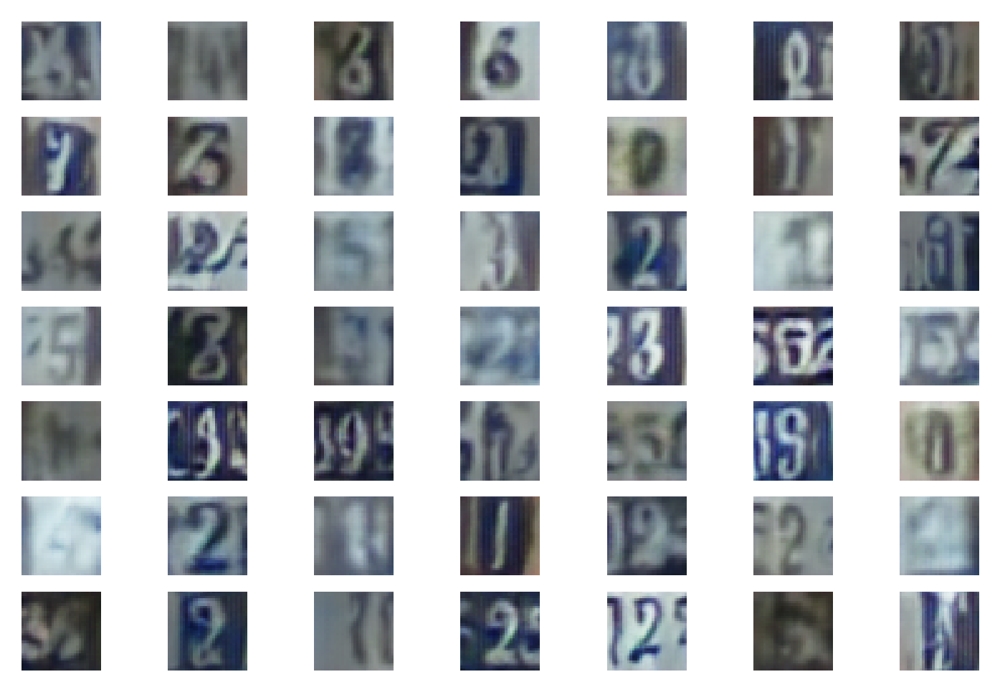

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 17, Batch: 1 of 572
 Discriminator real loss: 0.6704537868499756, Discriminator Fake loss: 0.6745966672897339, Generator loss: 0.7152431011199951
 Epoch: 17, Batch: 101 of 572
 Discriminator real loss: 0.7189769148826599, Discriminator Fake loss: 0.6670516729354858, Generator loss: 0.7478139996528625
 Epoch: 17, Batch: 201 of 572
 Discriminator real loss: 0.6942822933197021, Discriminator Fake loss: 0.664604663848877, Generator loss: 0.7428724765777588
 Epoch: 17, Batch: 301 of 572
 Discriminator real loss: 0.677454948425293, Discriminator Fake loss: 0.6637662649154663, Generator loss: 0.7376787662506104
 Epoch: 17, Batch: 401 of 572
 Discriminator real loss: 0.7152570486068726, Discriminator Fake loss: 0.6840407848358154, Generator loss: 0.7544375658035278
 Epoch: 17, Batch: 501 of 572
 Discriminator real loss: 0.7077392339706421, Discriminator Fake loss: 0.6706675291061401, Generator loss: 0.7443071603775024
***** Accuracy real: 57.33333230018616, fake: 60.66666841506958 ****

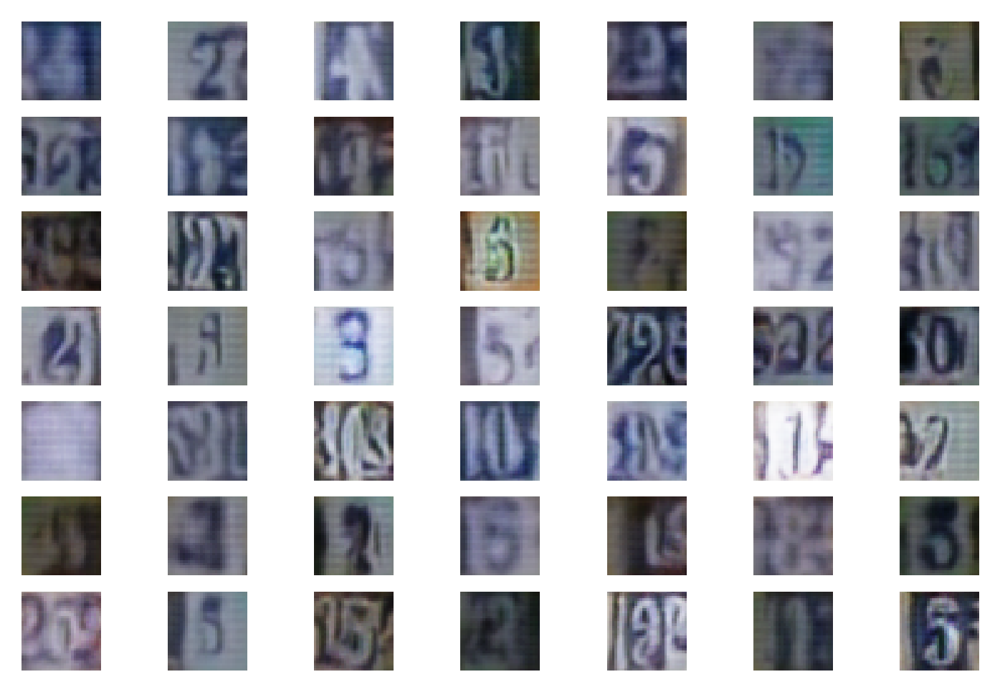

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 18, Batch: 1 of 572
 Discriminator real loss: 0.6955457329750061, Discriminator Fake loss: 0.7172375917434692, Generator loss: 0.6900686621665955
 Epoch: 18, Batch: 101 of 572
 Discriminator real loss: 0.6732735633850098, Discriminator Fake loss: 0.6959017515182495, Generator loss: 0.7457389831542969
 Epoch: 18, Batch: 201 of 572
 Discriminator real loss: 0.6850482225418091, Discriminator Fake loss: 0.6775084733963013, Generator loss: 0.7397981882095337
 Epoch: 18, Batch: 301 of 572
 Discriminator real loss: 0.6882965564727783, Discriminator Fake loss: 0.668332576751709, Generator loss: 0.7330867648124695
 Epoch: 18, Batch: 401 of 572
 Discriminator real loss: 0.7173793315887451, Discriminator Fake loss: 0.6971396803855896, Generator loss: 0.7489944696426392
 Epoch: 18, Batch: 501 of 572
 Discriminator real loss: 0.6861793398857117, Discriminator Fake loss: 0.6745441555976868, Generator loss: 0.7203534841537476
***** Accuracy real: 28.66666615009308, fake: 69.9999988079071 ****

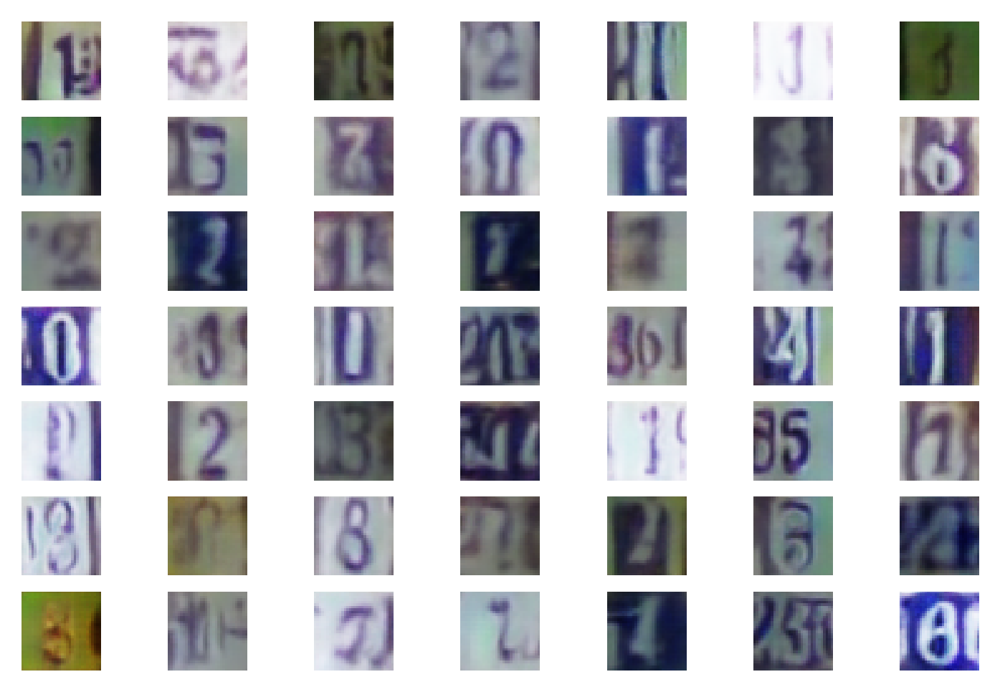

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 19, Batch: 1 of 572
 Discriminator real loss: 0.6843799948692322, Discriminator Fake loss: 0.6943702697753906, Generator loss: 0.7263485789299011
 Epoch: 19, Batch: 101 of 572
 Discriminator real loss: 0.6913681030273438, Discriminator Fake loss: 0.691295862197876, Generator loss: 0.728968620300293
 Epoch: 19, Batch: 201 of 572
 Discriminator real loss: 0.6633535027503967, Discriminator Fake loss: 0.6937101483345032, Generator loss: 0.7373797297477722
 Epoch: 19, Batch: 301 of 572
 Discriminator real loss: 0.6667842268943787, Discriminator Fake loss: 0.667289137840271, Generator loss: 0.7339279651641846
 Epoch: 19, Batch: 401 of 572
 Discriminator real loss: 0.6782422065734863, Discriminator Fake loss: 0.6522952318191528, Generator loss: 0.7314403653144836
 Epoch: 19, Batch: 501 of 572
 Discriminator real loss: 0.6924495697021484, Discriminator Fake loss: 0.6814152002334595, Generator loss: 0.7352104187011719
***** Accuracy real: 41.333332657814026, fake: 79.3333351612091 *****

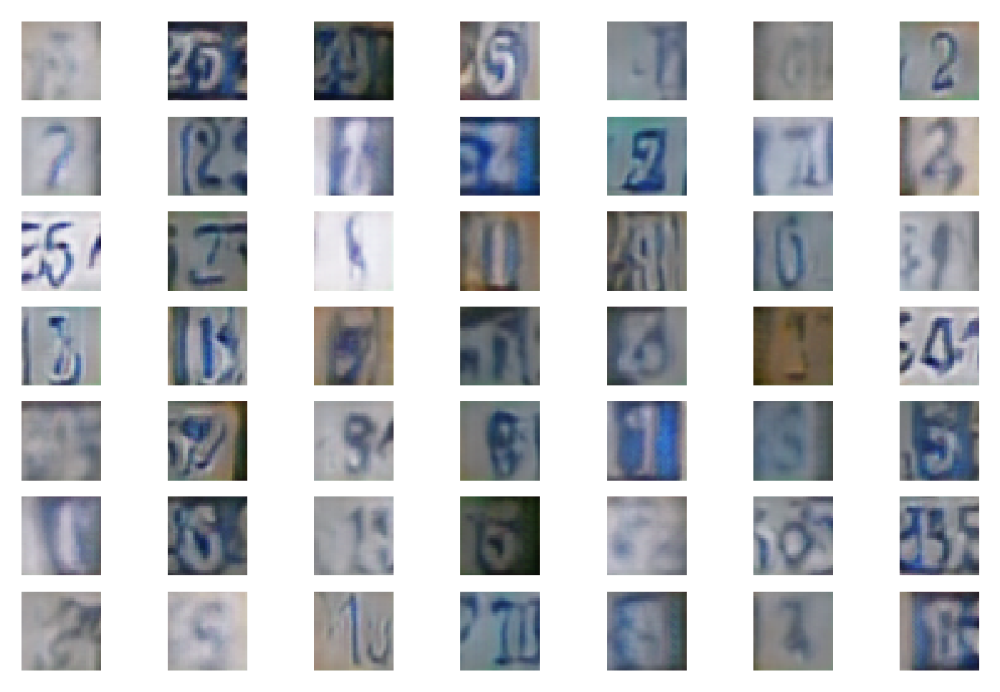

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 20, Batch: 1 of 572
 Discriminator real loss: 0.6695862412452698, Discriminator Fake loss: 0.670067548751831, Generator loss: 0.7377117872238159
 Epoch: 20, Batch: 101 of 572
 Discriminator real loss: 0.6722978353500366, Discriminator Fake loss: 0.6873696446418762, Generator loss: 0.7319620847702026
 Epoch: 20, Batch: 201 of 572
 Discriminator real loss: 0.7121675610542297, Discriminator Fake loss: 0.6673281192779541, Generator loss: 0.740916907787323
 Epoch: 20, Batch: 301 of 572
 Discriminator real loss: 0.6932942867279053, Discriminator Fake loss: 0.6549825668334961, Generator loss: 0.7629443407058716
 Epoch: 20, Batch: 401 of 572
 Discriminator real loss: 0.6689772009849548, Discriminator Fake loss: 0.6904284954071045, Generator loss: 0.7270269989967346
 Epoch: 20, Batch: 501 of 572
 Discriminator real loss: 0.7198072075843811, Discriminator Fake loss: 0.6736443638801575, Generator loss: 0.7524740099906921
***** Accuracy real: 56.00000023841858, fake: 77.99999713897705 ****

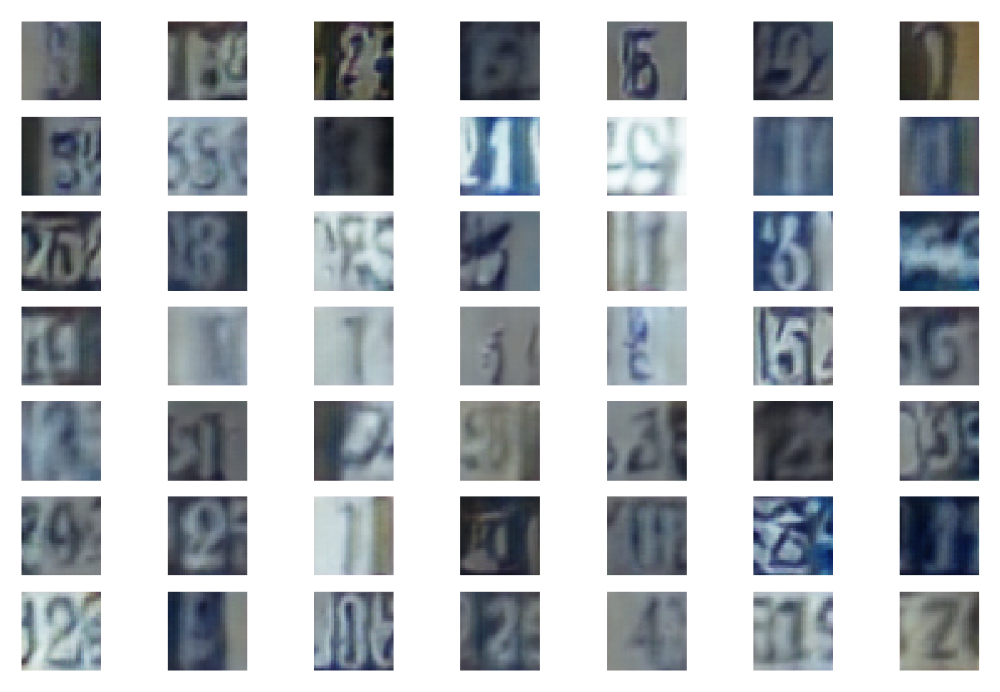

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 21, Batch: 1 of 572
 Discriminator real loss: 0.6719094514846802, Discriminator Fake loss: 0.6921678185462952, Generator loss: 0.7292793989181519
 Epoch: 21, Batch: 101 of 572
 Discriminator real loss: 0.6877592206001282, Discriminator Fake loss: 0.6797517538070679, Generator loss: 0.7286279201507568
 Epoch: 21, Batch: 201 of 572
 Discriminator real loss: 0.6985175609588623, Discriminator Fake loss: 0.6723618507385254, Generator loss: 0.7249111533164978
 Epoch: 21, Batch: 301 of 572
 Discriminator real loss: 0.6674028635025024, Discriminator Fake loss: 0.6650195121765137, Generator loss: 0.7282386422157288
 Epoch: 21, Batch: 401 of 572
 Discriminator real loss: 0.6660534739494324, Discriminator Fake loss: 0.690241813659668, Generator loss: 0.7163468599319458
 Epoch: 21, Batch: 501 of 572
 Discriminator real loss: 0.7154427766799927, Discriminator Fake loss: 0.6847161054611206, Generator loss: 0.744137704372406
***** Accuracy real: 31.999999284744263, fake: 77.33333110809326 ***

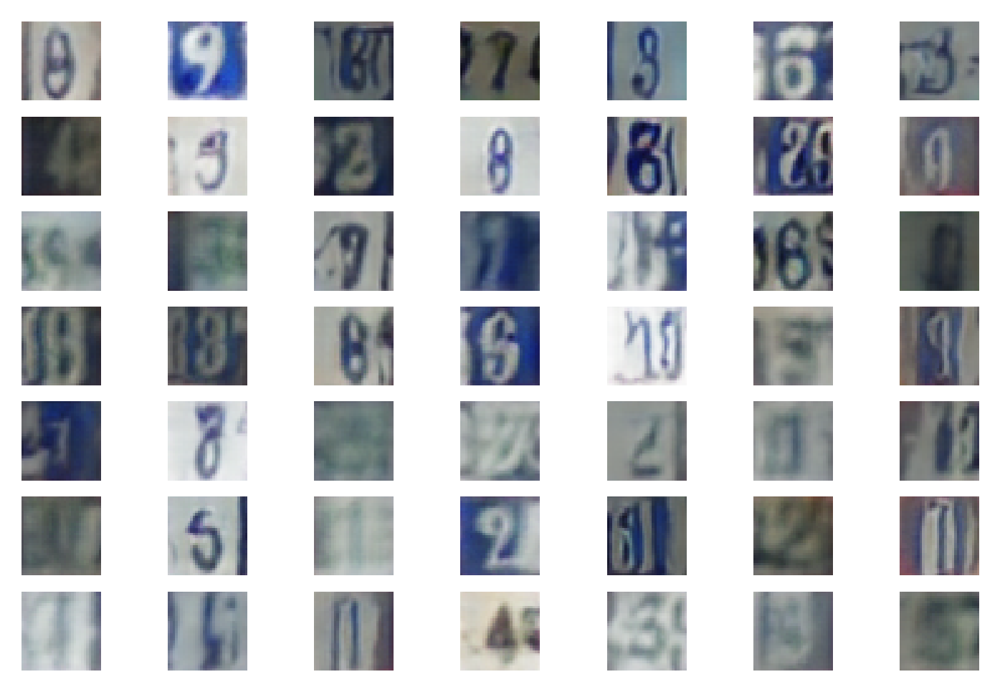

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 22, Batch: 1 of 572
 Discriminator real loss: 0.6831784248352051, Discriminator Fake loss: 0.6921333074569702, Generator loss: 0.7142536640167236
 Epoch: 22, Batch: 101 of 572
 Discriminator real loss: 0.6577205061912537, Discriminator Fake loss: 0.6831063628196716, Generator loss: 0.7060601711273193
 Epoch: 22, Batch: 201 of 572
 Discriminator real loss: 0.6618120670318604, Discriminator Fake loss: 0.6673212051391602, Generator loss: 0.7382381558418274
 Epoch: 22, Batch: 301 of 572
 Discriminator real loss: 0.6906270980834961, Discriminator Fake loss: 0.6765937209129333, Generator loss: 0.735084056854248
 Epoch: 22, Batch: 401 of 572
 Discriminator real loss: 0.732640266418457, Discriminator Fake loss: 0.6682806015014648, Generator loss: 0.7406011819839478
 Epoch: 22, Batch: 501 of 572
 Discriminator real loss: 0.6784863471984863, Discriminator Fake loss: 0.7097055912017822, Generator loss: 0.7241448760032654
***** Accuracy real: 39.33333456516266, fake: 81.99999928474426 ****

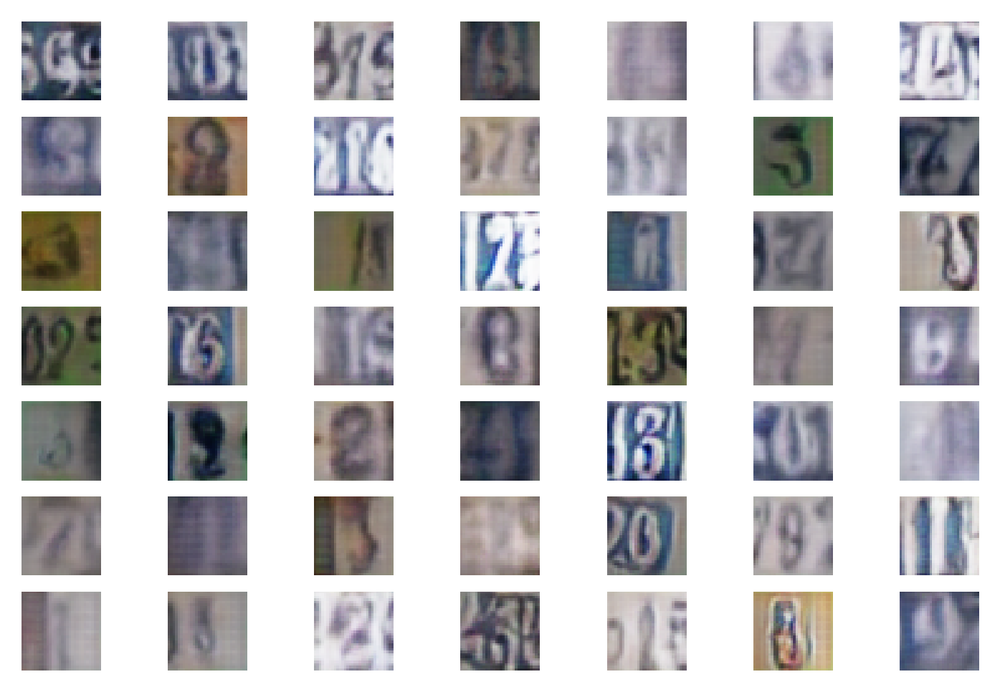

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 23, Batch: 1 of 572
 Discriminator real loss: 0.6743444800376892, Discriminator Fake loss: 0.7007333040237427, Generator loss: 0.7262394428253174
 Epoch: 23, Batch: 101 of 572
 Discriminator real loss: 0.6871621608734131, Discriminator Fake loss: 0.7234936952590942, Generator loss: 0.7014366388320923
 Epoch: 23, Batch: 201 of 572
 Discriminator real loss: 0.6696325540542603, Discriminator Fake loss: 0.687149167060852, Generator loss: 0.7096351981163025
 Epoch: 23, Batch: 301 of 572
 Discriminator real loss: 0.6847480535507202, Discriminator Fake loss: 0.6831549406051636, Generator loss: 0.73540198802948
 Epoch: 23, Batch: 401 of 572
 Discriminator real loss: 0.7443954944610596, Discriminator Fake loss: 0.6712188720703125, Generator loss: 0.739655077457428
 Epoch: 23, Batch: 501 of 572
 Discriminator real loss: 0.7208937406539917, Discriminator Fake loss: 0.6685569882392883, Generator loss: 0.7202644348144531
***** Accuracy real: 27.3333340883255, fake: 73.33333492279053 *****


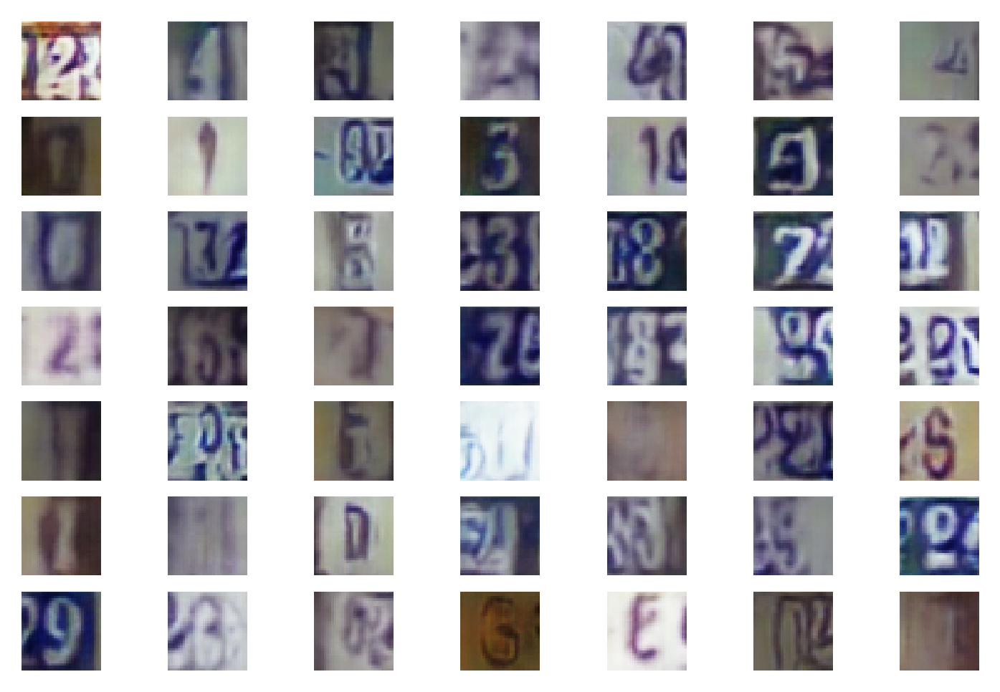

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 24, Batch: 1 of 572
 Discriminator real loss: 0.6800810694694519, Discriminator Fake loss: 0.6945269703865051, Generator loss: 0.727236270904541
 Epoch: 24, Batch: 101 of 572
 Discriminator real loss: 0.6705607175827026, Discriminator Fake loss: 0.6987705230712891, Generator loss: 0.714146077632904
 Epoch: 24, Batch: 201 of 572
 Discriminator real loss: 0.6957015991210938, Discriminator Fake loss: 0.6732343435287476, Generator loss: 0.7236076593399048
 Epoch: 24, Batch: 301 of 572
 Discriminator real loss: 0.6353256702423096, Discriminator Fake loss: 0.721032977104187, Generator loss: 0.7283719778060913
 Epoch: 24, Batch: 401 of 572
 Discriminator real loss: 0.7106698751449585, Discriminator Fake loss: 0.6779511570930481, Generator loss: 0.7324389219284058
 Epoch: 24, Batch: 501 of 572
 Discriminator real loss: 0.7230929136276245, Discriminator Fake loss: 0.7649200558662415, Generator loss: 0.7679224014282227
***** Accuracy real: 40.66666662693024, fake: 70.6666648387909 *****


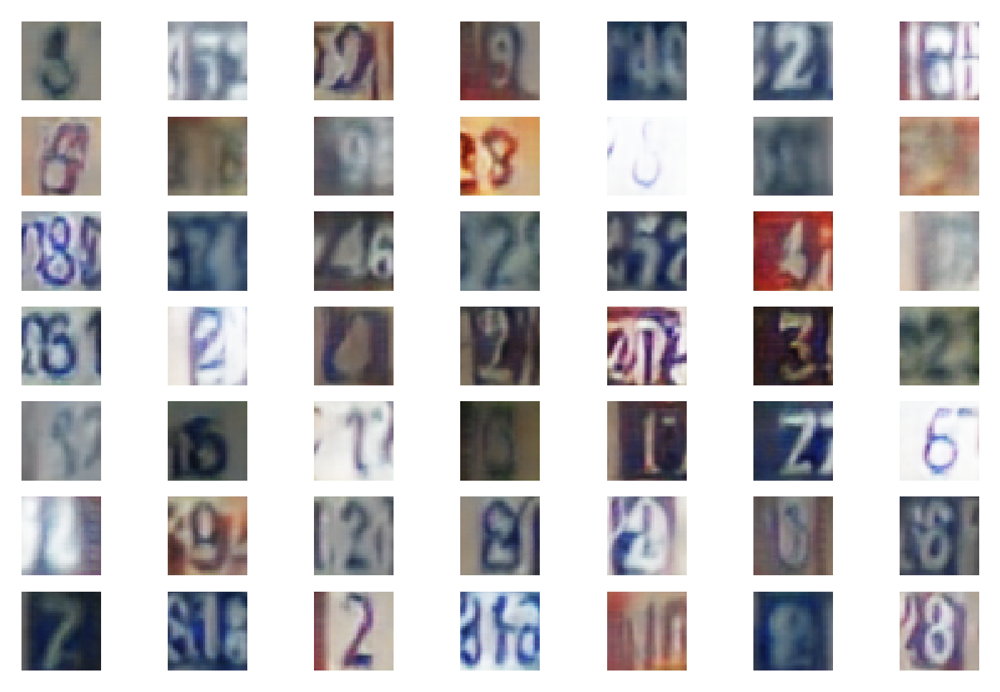

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 25, Batch: 1 of 572
 Discriminator real loss: 0.6684921979904175, Discriminator Fake loss: 0.7040777206420898, Generator loss: 0.7319929599761963
 Epoch: 25, Batch: 101 of 572
 Discriminator real loss: 0.72034752368927, Discriminator Fake loss: 0.6796383261680603, Generator loss: 0.7323063015937805
 Epoch: 25, Batch: 201 of 572
 Discriminator real loss: 0.7007213830947876, Discriminator Fake loss: 0.6936566233634949, Generator loss: 0.7291600704193115
 Epoch: 25, Batch: 301 of 572
 Discriminator real loss: 0.7362605929374695, Discriminator Fake loss: 0.6898765563964844, Generator loss: 0.7586703300476074
 Epoch: 25, Batch: 401 of 572
 Discriminator real loss: 0.6788653135299683, Discriminator Fake loss: 0.6813604831695557, Generator loss: 0.7178434729576111
 Epoch: 25, Batch: 501 of 572
 Discriminator real loss: 0.6837843656539917, Discriminator Fake loss: 0.7001178860664368, Generator loss: 0.7221435308456421
***** Accuracy real: 33.33333432674408, fake: 88.66666555404663 ****

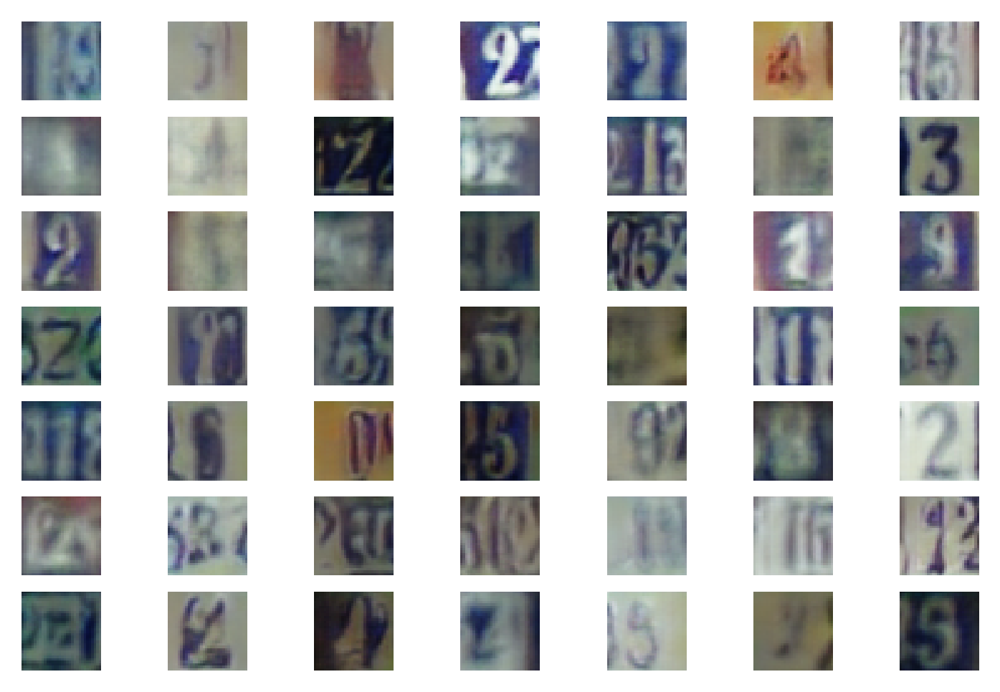

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 26, Batch: 1 of 572
 Discriminator real loss: 0.6762913465499878, Discriminator Fake loss: 0.6707942485809326, Generator loss: 0.7144870758056641
 Epoch: 26, Batch: 101 of 572
 Discriminator real loss: 0.6689563989639282, Discriminator Fake loss: 0.7023267149925232, Generator loss: 0.7110379934310913
 Epoch: 26, Batch: 201 of 572
 Discriminator real loss: 0.6705942153930664, Discriminator Fake loss: 0.6885768175125122, Generator loss: 0.7077469825744629
 Epoch: 26, Batch: 301 of 572
 Discriminator real loss: 0.6754304766654968, Discriminator Fake loss: 0.725967526435852, Generator loss: 0.718250036239624
 Epoch: 26, Batch: 401 of 572
 Discriminator real loss: 0.7186974883079529, Discriminator Fake loss: 0.7046403884887695, Generator loss: 0.7346595525741577
 Epoch: 26, Batch: 501 of 572
 Discriminator real loss: 0.685765266418457, Discriminator Fake loss: 0.7216299772262573, Generator loss: 0.7156415581703186
***** Accuracy real: 34.66666638851166, fake: 69.9999988079071 *****


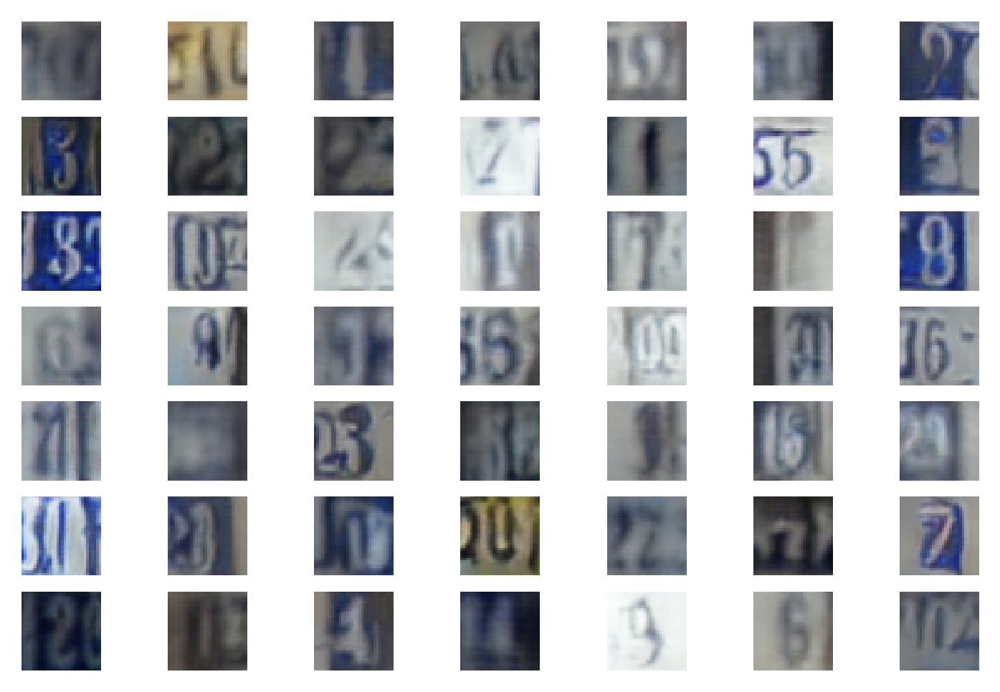

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 27, Batch: 1 of 572
 Discriminator real loss: 0.6749791502952576, Discriminator Fake loss: 0.6932672262191772, Generator loss: 0.724818766117096
 Epoch: 27, Batch: 101 of 572
 Discriminator real loss: 0.7018414735794067, Discriminator Fake loss: 0.6430938839912415, Generator loss: 0.7486122250556946
 Epoch: 27, Batch: 201 of 572
 Discriminator real loss: 0.6671406626701355, Discriminator Fake loss: 0.6700398921966553, Generator loss: 0.7409051060676575
 Epoch: 27, Batch: 301 of 572
 Discriminator real loss: 0.712256669998169, Discriminator Fake loss: 0.6875314116477966, Generator loss: 0.730669379234314
 Epoch: 27, Batch: 401 of 572
 Discriminator real loss: 0.7088512778282166, Discriminator Fake loss: 0.674109160900116, Generator loss: 0.7448325753211975
 Epoch: 27, Batch: 501 of 572
 Discriminator real loss: 0.7206730842590332, Discriminator Fake loss: 0.6451727151870728, Generator loss: 0.7572237253189087
***** Accuracy real: 36.000001430511475, fake: 79.3333351612091 *****


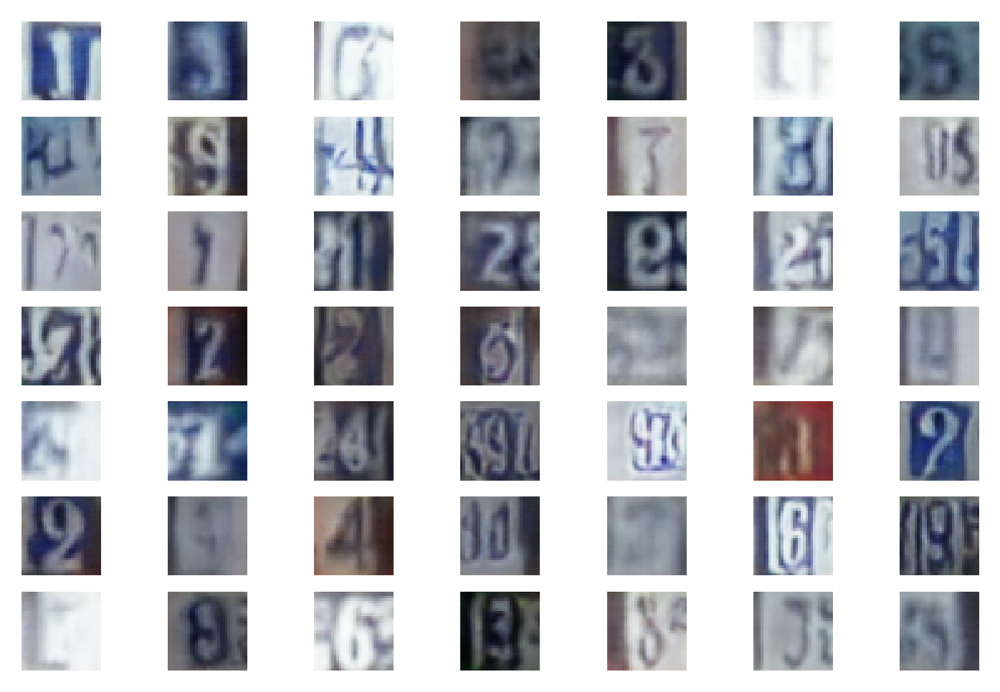

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 28, Batch: 1 of 572
 Discriminator real loss: 0.6804496049880981, Discriminator Fake loss: 0.6717286109924316, Generator loss: 0.7293989062309265
 Epoch: 28, Batch: 101 of 572
 Discriminator real loss: 0.6530691385269165, Discriminator Fake loss: 0.7080021500587463, Generator loss: 0.7227227687835693
 Epoch: 28, Batch: 201 of 572
 Discriminator real loss: 0.6940721273422241, Discriminator Fake loss: 0.6758815050125122, Generator loss: 0.7322765588760376
 Epoch: 28, Batch: 301 of 572
 Discriminator real loss: 0.6905074119567871, Discriminator Fake loss: 0.7040964365005493, Generator loss: 0.7443039417266846
 Epoch: 28, Batch: 401 of 572
 Discriminator real loss: 0.6952846050262451, Discriminator Fake loss: 0.6327557563781738, Generator loss: 0.7796682715415955
 Epoch: 28, Batch: 501 of 572
 Discriminator real loss: 0.7230812311172485, Discriminator Fake loss: 0.6496912837028503, Generator loss: 0.7540150880813599
***** Accuracy real: 41.333332657814026, fake: 72.66666889190674 *

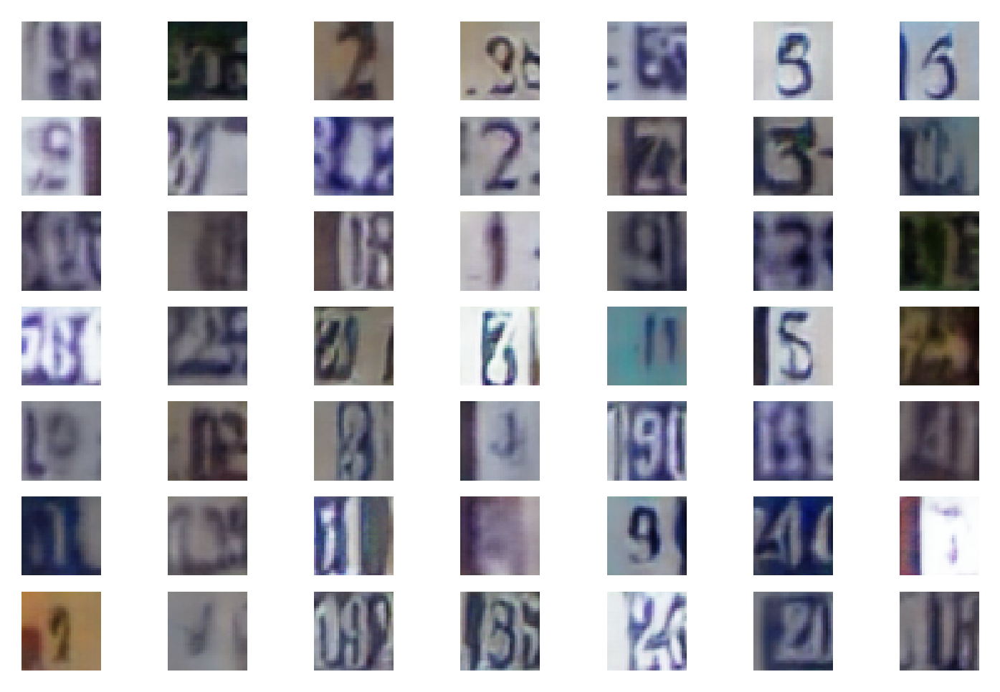

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 29, Batch: 1 of 572
 Discriminator real loss: 0.671075701713562, Discriminator Fake loss: 0.6746617555618286, Generator loss: 0.7496005892753601
 Epoch: 29, Batch: 101 of 572
 Discriminator real loss: 0.6541417837142944, Discriminator Fake loss: 0.730090856552124, Generator loss: 0.7130922675132751
 Epoch: 29, Batch: 201 of 572
 Discriminator real loss: 0.6728925108909607, Discriminator Fake loss: 0.6598043441772461, Generator loss: 0.7748122811317444
 Epoch: 29, Batch: 301 of 572
 Discriminator real loss: 0.658367395401001, Discriminator Fake loss: 0.680824339389801, Generator loss: 0.7313755750656128
 Epoch: 29, Batch: 401 of 572
 Discriminator real loss: 0.7291440963745117, Discriminator Fake loss: 0.6829326152801514, Generator loss: 0.7485078573226929
 Epoch: 29, Batch: 501 of 572
 Discriminator real loss: 0.6556802988052368, Discriminator Fake loss: 0.7232896685600281, Generator loss: 0.6822174787521362
***** Accuracy real: 31.333333253860474, fake: 78.66666913032532 *****

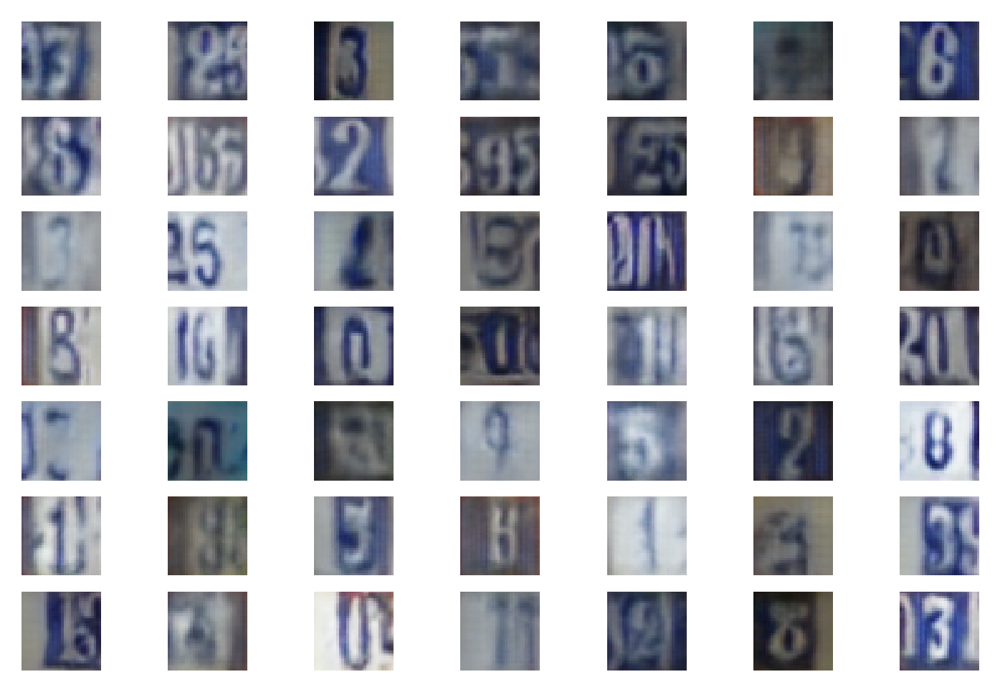

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 30, Batch: 1 of 572
 Discriminator real loss: 0.673772394657135, Discriminator Fake loss: 0.6840330362319946, Generator loss: 0.7576436996459961
 Epoch: 30, Batch: 101 of 572
 Discriminator real loss: 0.696153998374939, Discriminator Fake loss: 0.6872971057891846, Generator loss: 0.7168430089950562
 Epoch: 30, Batch: 201 of 572
 Discriminator real loss: 0.7366195917129517, Discriminator Fake loss: 0.6525018811225891, Generator loss: 0.772191047668457
 Epoch: 30, Batch: 301 of 572
 Discriminator real loss: 0.7025132179260254, Discriminator Fake loss: 0.6851326823234558, Generator loss: 0.7220335602760315
 Epoch: 30, Batch: 401 of 572
 Discriminator real loss: 0.6444427371025085, Discriminator Fake loss: 0.6800602674484253, Generator loss: 0.7386108040809631
 Epoch: 30, Batch: 501 of 572
 Discriminator real loss: 0.6733481287956238, Discriminator Fake loss: 0.6557199358940125, Generator loss: 0.7222318649291992
***** Accuracy real: 42.66666769981384, fake: 65.3333306312561 *****


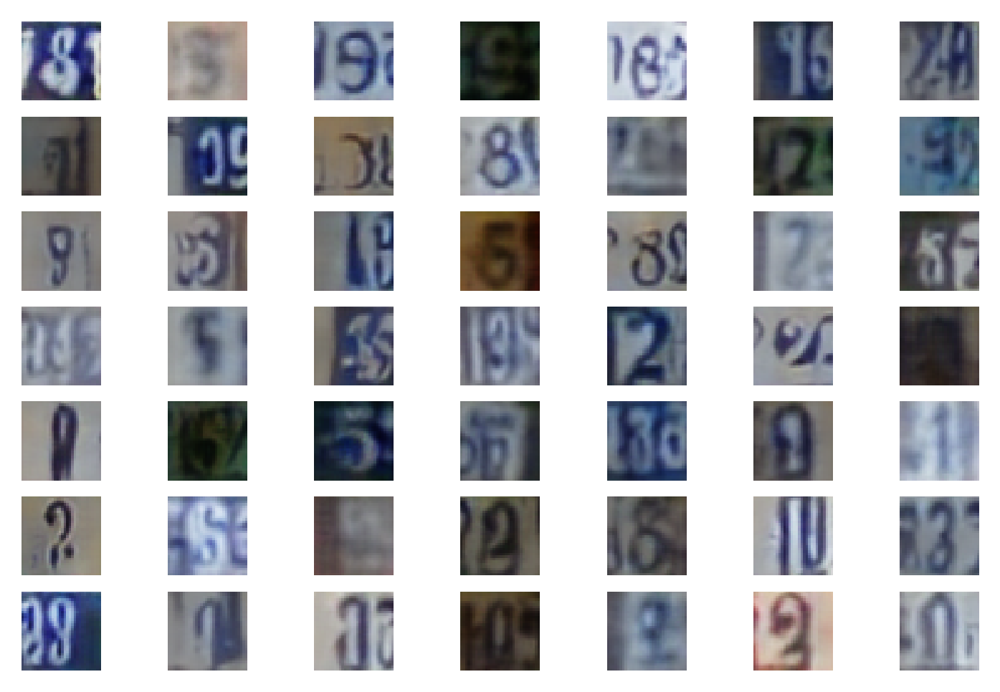

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 31, Batch: 1 of 572
 Discriminator real loss: 0.6775094866752625, Discriminator Fake loss: 0.7264220714569092, Generator loss: 0.7220141887664795
 Epoch: 31, Batch: 101 of 572
 Discriminator real loss: 0.6711990237236023, Discriminator Fake loss: 0.6592299938201904, Generator loss: 0.7329582571983337
 Epoch: 31, Batch: 201 of 572
 Discriminator real loss: 0.6932997703552246, Discriminator Fake loss: 0.6928060054779053, Generator loss: 0.7218848466873169
 Epoch: 31, Batch: 301 of 572
 Discriminator real loss: 0.6802119612693787, Discriminator Fake loss: 0.7056543827056885, Generator loss: 0.7038475275039673
 Epoch: 31, Batch: 401 of 572
 Discriminator real loss: 0.7008291482925415, Discriminator Fake loss: 0.7035831809043884, Generator loss: 0.744318962097168
 Epoch: 31, Batch: 501 of 572
 Discriminator real loss: 0.7279259562492371, Discriminator Fake loss: 0.6409209966659546, Generator loss: 0.7989286184310913
***** Accuracy real: 29.333332180976868, fake: 85.33333539962769 **

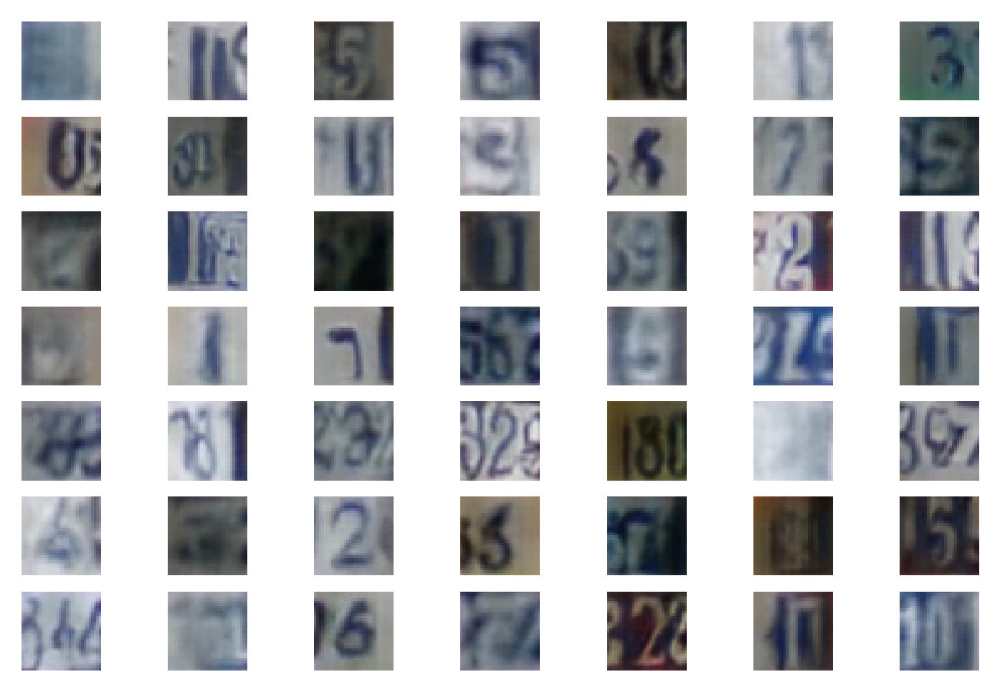

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 32, Batch: 1 of 572
 Discriminator real loss: 0.6638607382774353, Discriminator Fake loss: 0.663202702999115, Generator loss: 0.7351446151733398
 Epoch: 32, Batch: 101 of 572
 Discriminator real loss: 0.680311918258667, Discriminator Fake loss: 0.6787055134773254, Generator loss: 0.7244040966033936
 Epoch: 32, Batch: 201 of 572
 Discriminator real loss: 0.6912053823471069, Discriminator Fake loss: 0.6637488603591919, Generator loss: 0.7290375828742981
 Epoch: 32, Batch: 301 of 572
 Discriminator real loss: 0.6869312524795532, Discriminator Fake loss: 0.6698598861694336, Generator loss: 0.7285765409469604
 Epoch: 32, Batch: 401 of 572
 Discriminator real loss: 0.6928402185440063, Discriminator Fake loss: 0.671058177947998, Generator loss: 0.7552589774131775
 Epoch: 32, Batch: 501 of 572
 Discriminator real loss: 0.6901419162750244, Discriminator Fake loss: 0.6797024607658386, Generator loss: 0.7376508712768555
***** Accuracy real: 45.33333480358124, fake: 59.333330392837524 ****

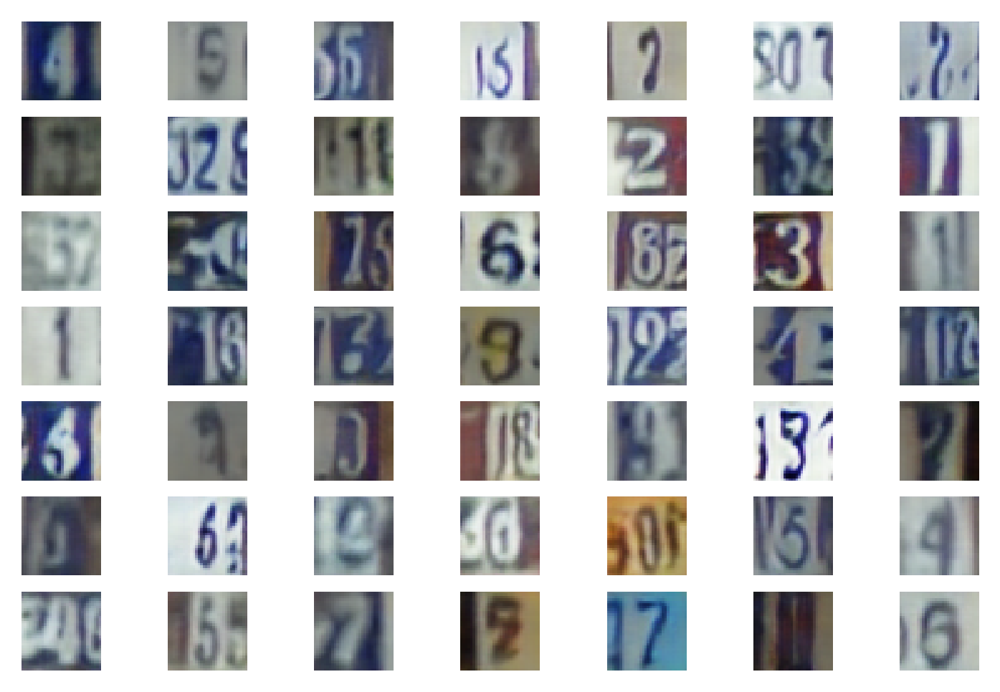

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 33, Batch: 1 of 572
 Discriminator real loss: 0.6864991784095764, Discriminator Fake loss: 0.738157331943512, Generator loss: 0.7077845335006714
 Epoch: 33, Batch: 101 of 572
 Discriminator real loss: 0.7111380100250244, Discriminator Fake loss: 0.7606695890426636, Generator loss: 0.7479606866836548
 Epoch: 33, Batch: 201 of 572
 Discriminator real loss: 0.6956052184104919, Discriminator Fake loss: 0.6707234382629395, Generator loss: 0.7596562504768372
 Epoch: 33, Batch: 301 of 572
 Discriminator real loss: 0.6506523489952087, Discriminator Fake loss: 0.6769552230834961, Generator loss: 0.73499596118927
 Epoch: 33, Batch: 401 of 572
 Discriminator real loss: 0.696517288684845, Discriminator Fake loss: 0.6959148645401001, Generator loss: 0.791433572769165
 Epoch: 33, Batch: 501 of 572
 Discriminator real loss: 0.6786267757415771, Discriminator Fake loss: 0.7156054377555847, Generator loss: 0.7637546062469482
***** Accuracy real: 46.00000083446503, fake: 77.33333110809326 *****


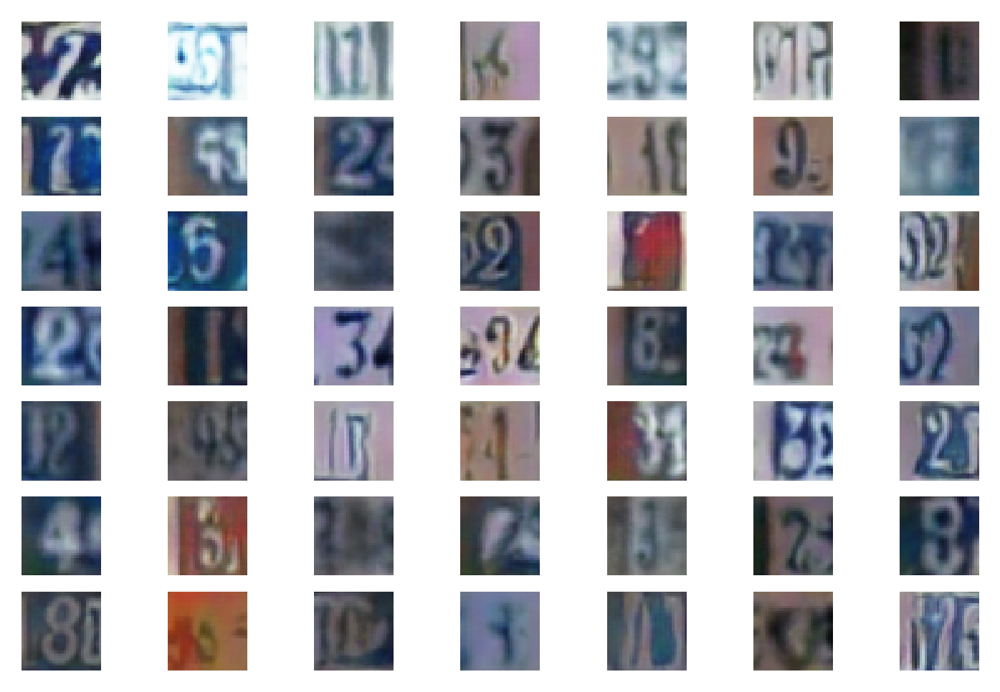

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 34, Batch: 1 of 572
 Discriminator real loss: 0.6746314167976379, Discriminator Fake loss: 0.6821469068527222, Generator loss: 0.7491486072540283
 Epoch: 34, Batch: 101 of 572
 Discriminator real loss: 0.6704525351524353, Discriminator Fake loss: 0.7157872319221497, Generator loss: 0.7328966856002808
 Epoch: 34, Batch: 201 of 572
 Discriminator real loss: 0.6725358366966248, Discriminator Fake loss: 0.6659180521965027, Generator loss: 0.7229154109954834
 Epoch: 34, Batch: 301 of 572
 Discriminator real loss: 0.6877985000610352, Discriminator Fake loss: 0.6511874198913574, Generator loss: 0.7529138922691345
 Epoch: 34, Batch: 401 of 572
 Discriminator real loss: 0.6790198087692261, Discriminator Fake loss: 0.691085696220398, Generator loss: 0.7410352230072021
 Epoch: 34, Batch: 501 of 572
 Discriminator real loss: 0.7215420007705688, Discriminator Fake loss: 0.6790755987167358, Generator loss: 0.7429388165473938
***** Accuracy real: 47.999998927116394, fake: 72.00000286102295 **

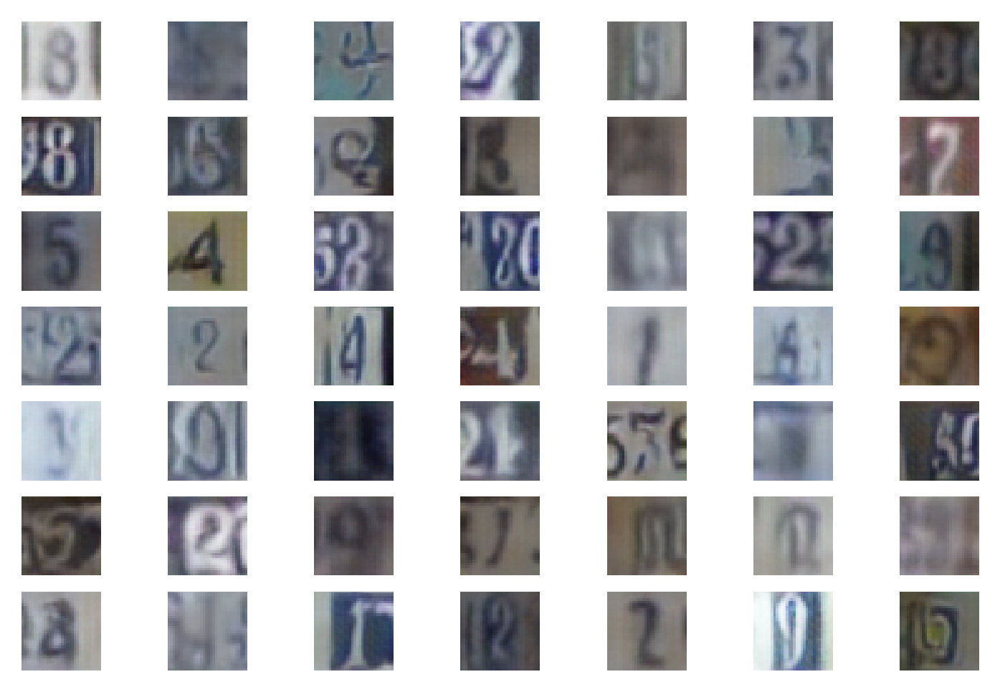

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 35, Batch: 1 of 572
 Discriminator real loss: 0.689702033996582, Discriminator Fake loss: 0.702134907245636, Generator loss: 0.7046353816986084
 Epoch: 35, Batch: 101 of 572
 Discriminator real loss: 0.7324579954147339, Discriminator Fake loss: 0.6702159643173218, Generator loss: 0.7375279068946838
 Epoch: 35, Batch: 201 of 572
 Discriminator real loss: 0.6901978254318237, Discriminator Fake loss: 0.7146264314651489, Generator loss: 0.7234485149383545
 Epoch: 35, Batch: 301 of 572
 Discriminator real loss: 0.6982459425926208, Discriminator Fake loss: 0.6728852987289429, Generator loss: 0.7131880521774292
 Epoch: 35, Batch: 401 of 572
 Discriminator real loss: 0.717246413230896, Discriminator Fake loss: 0.6932142376899719, Generator loss: 0.7391831874847412
 Epoch: 35, Batch: 501 of 572
 Discriminator real loss: 0.7123576402664185, Discriminator Fake loss: 0.6841299533843994, Generator loss: 0.7012830376625061
***** Accuracy real: 43.99999976158142, fake: 74.00000095367432 *****

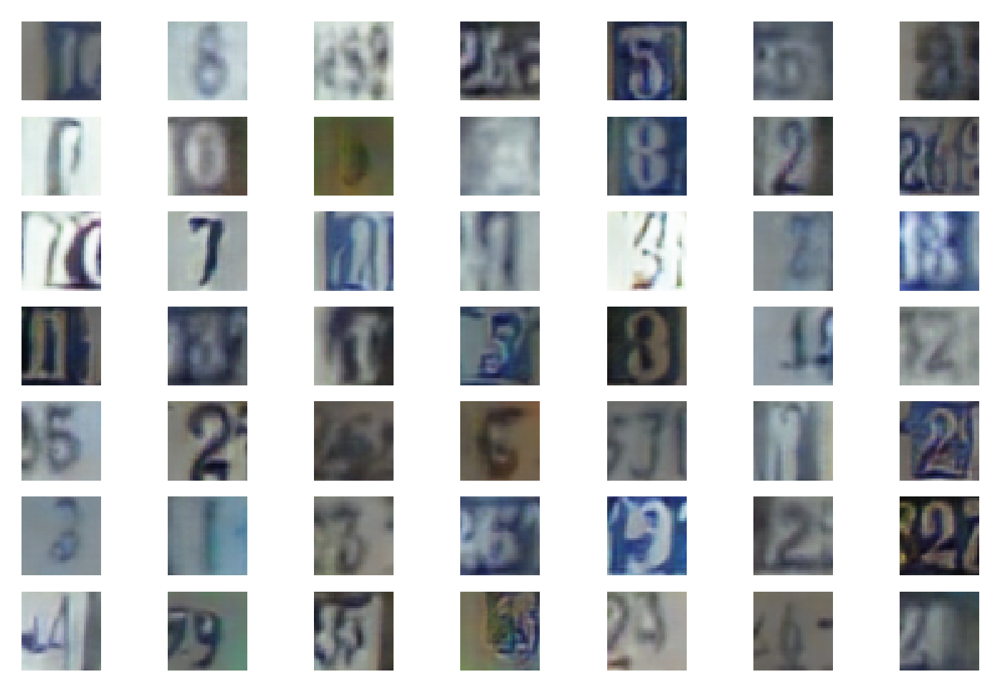

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 36, Batch: 1 of 572
 Discriminator real loss: 0.6644780039787292, Discriminator Fake loss: 0.6783791184425354, Generator loss: 0.7215456366539001
 Epoch: 36, Batch: 101 of 572
 Discriminator real loss: 0.6830391883850098, Discriminator Fake loss: 0.6783539056777954, Generator loss: 0.7082405090332031
 Epoch: 36, Batch: 201 of 572
 Discriminator real loss: 0.6908455491065979, Discriminator Fake loss: 0.6913188695907593, Generator loss: 0.742989718914032
 Epoch: 36, Batch: 301 of 572
 Discriminator real loss: 0.635036289691925, Discriminator Fake loss: 0.7189328074455261, Generator loss: 0.7010581493377686
 Epoch: 36, Batch: 401 of 572
 Discriminator real loss: 0.7131500244140625, Discriminator Fake loss: 0.6517046093940735, Generator loss: 0.7420992255210876
 Epoch: 36, Batch: 501 of 572
 Discriminator real loss: 0.7032988667488098, Discriminator Fake loss: 0.6730474829673767, Generator loss: 0.7384124398231506
***** Accuracy real: 37.99999952316284, fake: 77.99999713897705 ****

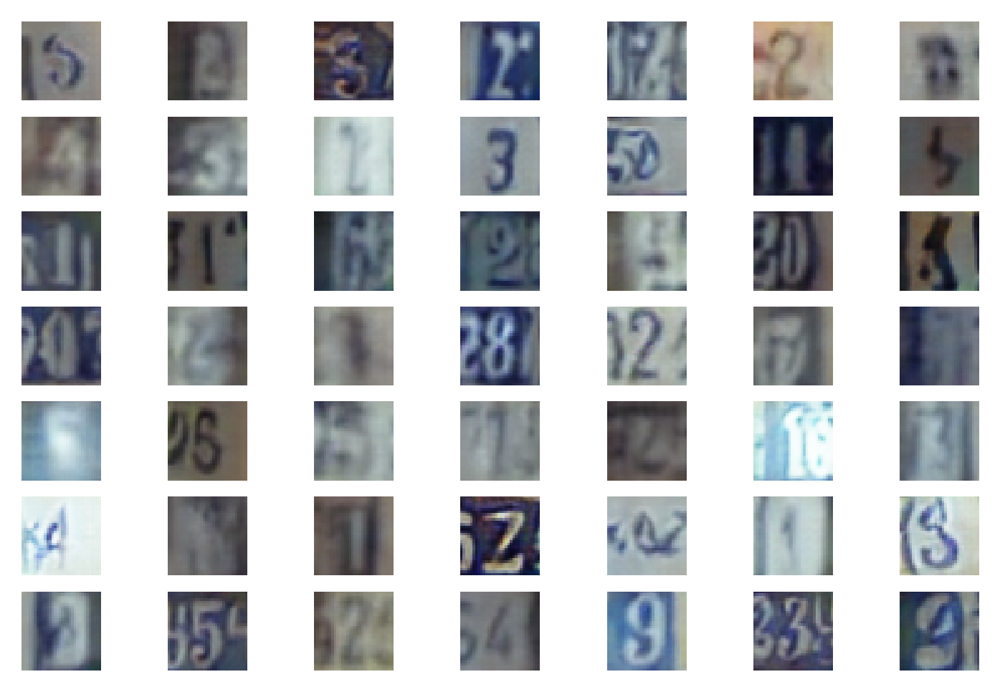

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 37, Batch: 1 of 572
 Discriminator real loss: 0.6804156303405762, Discriminator Fake loss: 0.6965992450714111, Generator loss: 0.7310839891433716
 Epoch: 37, Batch: 101 of 572
 Discriminator real loss: 0.6991386413574219, Discriminator Fake loss: 0.6745279431343079, Generator loss: 0.7291423082351685
 Epoch: 37, Batch: 201 of 572
 Discriminator real loss: 0.6604617834091187, Discriminator Fake loss: 0.6786472797393799, Generator loss: 0.7620505690574646
 Epoch: 37, Batch: 301 of 572
 Discriminator real loss: 0.6566735506057739, Discriminator Fake loss: 0.6766868233680725, Generator loss: 0.7169440984725952
 Epoch: 37, Batch: 401 of 572
 Discriminator real loss: 0.6755034923553467, Discriminator Fake loss: 0.6604492664337158, Generator loss: 0.7524921298027039
 Epoch: 37, Batch: 501 of 572
 Discriminator real loss: 0.7028969526290894, Discriminator Fake loss: 0.7045163512229919, Generator loss: 0.7483119368553162
***** Accuracy real: 40.00000059604645, fake: 78.66666913032532 **

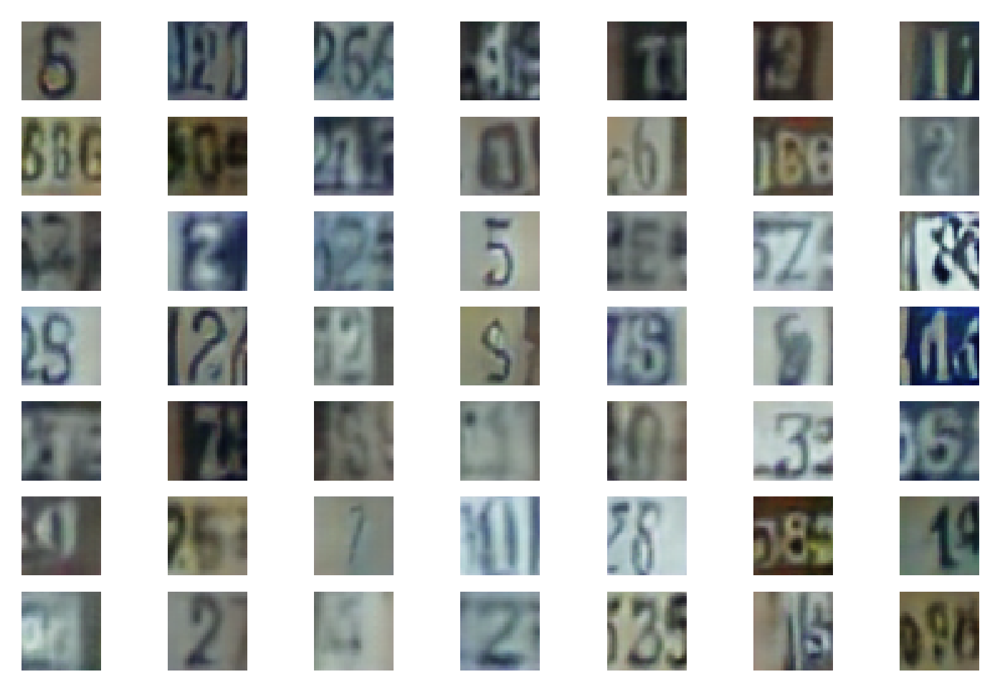

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 38, Batch: 1 of 572
 Discriminator real loss: 0.6729212999343872, Discriminator Fake loss: 0.671736478805542, Generator loss: 0.7281230688095093
 Epoch: 38, Batch: 101 of 572
 Discriminator real loss: 0.699884295463562, Discriminator Fake loss: 0.6434473991394043, Generator loss: 0.7521255016326904
 Epoch: 38, Batch: 201 of 572
 Discriminator real loss: 0.6983209848403931, Discriminator Fake loss: 0.6872394680976868, Generator loss: 0.7236603498458862
 Epoch: 38, Batch: 301 of 572
 Discriminator real loss: 0.6709173917770386, Discriminator Fake loss: 0.6313944458961487, Generator loss: 0.7889905571937561
 Epoch: 38, Batch: 401 of 572
 Discriminator real loss: 0.711672306060791, Discriminator Fake loss: 0.6692774295806885, Generator loss: 0.7336965203285217
 Epoch: 38, Batch: 501 of 572
 Discriminator real loss: 0.6515821814537048, Discriminator Fake loss: 0.6862759590148926, Generator loss: 0.7266676425933838
***** Accuracy real: 54.00000214576721, fake: 59.333330392837524 ****

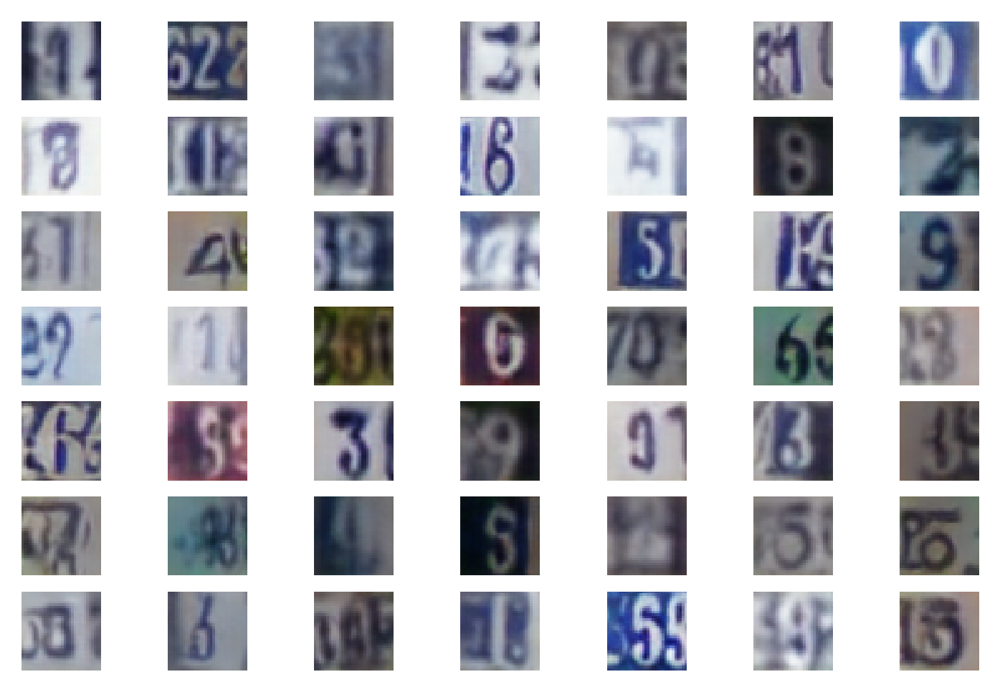

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 39, Batch: 1 of 572
 Discriminator real loss: 0.681482195854187, Discriminator Fake loss: 0.686207115650177, Generator loss: 0.7259636521339417
 Epoch: 39, Batch: 101 of 572
 Discriminator real loss: 0.681563138961792, Discriminator Fake loss: 0.685390055179596, Generator loss: 0.714363157749176
 Epoch: 39, Batch: 201 of 572
 Discriminator real loss: 0.7024301290512085, Discriminator Fake loss: 0.7519458532333374, Generator loss: 0.7201720476150513
 Epoch: 39, Batch: 301 of 572
 Discriminator real loss: 0.6728081107139587, Discriminator Fake loss: 0.6948816180229187, Generator loss: 0.7227929830551147
 Epoch: 39, Batch: 401 of 572
 Discriminator real loss: 0.6935991644859314, Discriminator Fake loss: 0.677600085735321, Generator loss: 0.7642608284950256
 Epoch: 39, Batch: 501 of 572
 Discriminator real loss: 0.6749484539031982, Discriminator Fake loss: 0.6799288988113403, Generator loss: 0.7016403079032898
***** Accuracy real: 40.66666662693024, fake: 72.00000286102295 *****


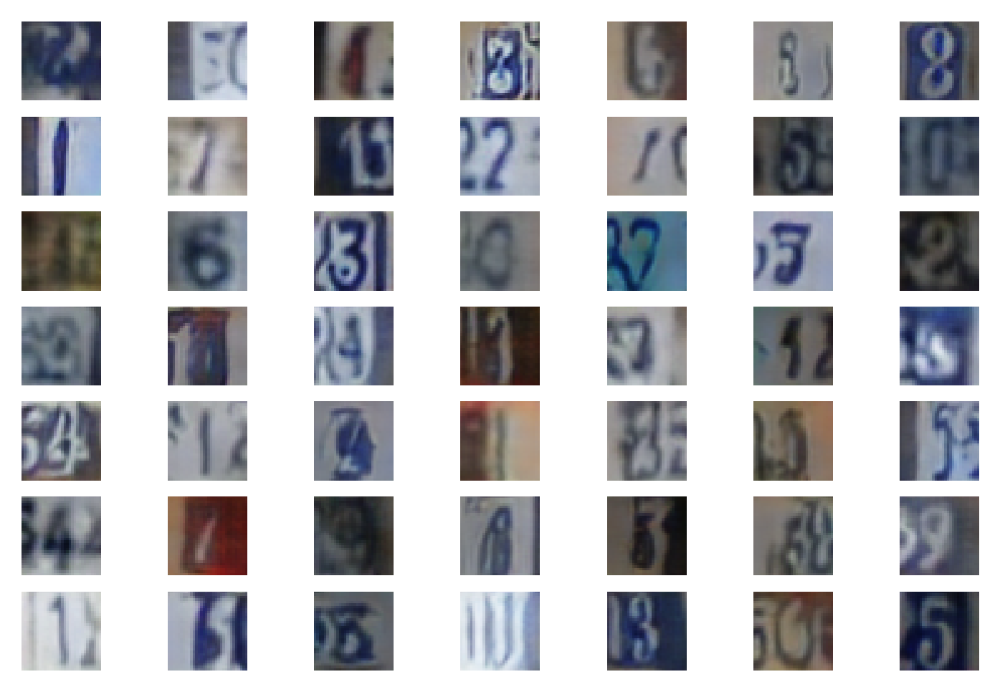

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


  0%|          | 0/572 [00:00<?, ?it/s]

 Epoch: 40, Batch: 1 of 572
 Discriminator real loss: 0.6848994493484497, Discriminator Fake loss: 0.6990811824798584, Generator loss: 0.7352682948112488
 Epoch: 40, Batch: 101 of 572
 Discriminator real loss: 0.6951557397842407, Discriminator Fake loss: 0.657395601272583, Generator loss: 0.7504547834396362
 Epoch: 40, Batch: 201 of 572
 Discriminator real loss: 0.708649218082428, Discriminator Fake loss: 0.6828358173370361, Generator loss: 0.7458014488220215
 Epoch: 40, Batch: 301 of 572
 Discriminator real loss: 0.6774367094039917, Discriminator Fake loss: 0.6610156297683716, Generator loss: 0.7410666346549988
 Epoch: 40, Batch: 401 of 572
 Discriminator real loss: 0.7245157361030579, Discriminator Fake loss: 0.6493216753005981, Generator loss: 0.7492973804473877
 Epoch: 40, Batch: 501 of 572
 Discriminator real loss: 0.6607012748718262, Discriminator Fake loss: 0.6788284778594971, Generator loss: 0.7358392477035522
***** Accuracy real: 41.333332657814026, fake: 68.00000071525574 ***

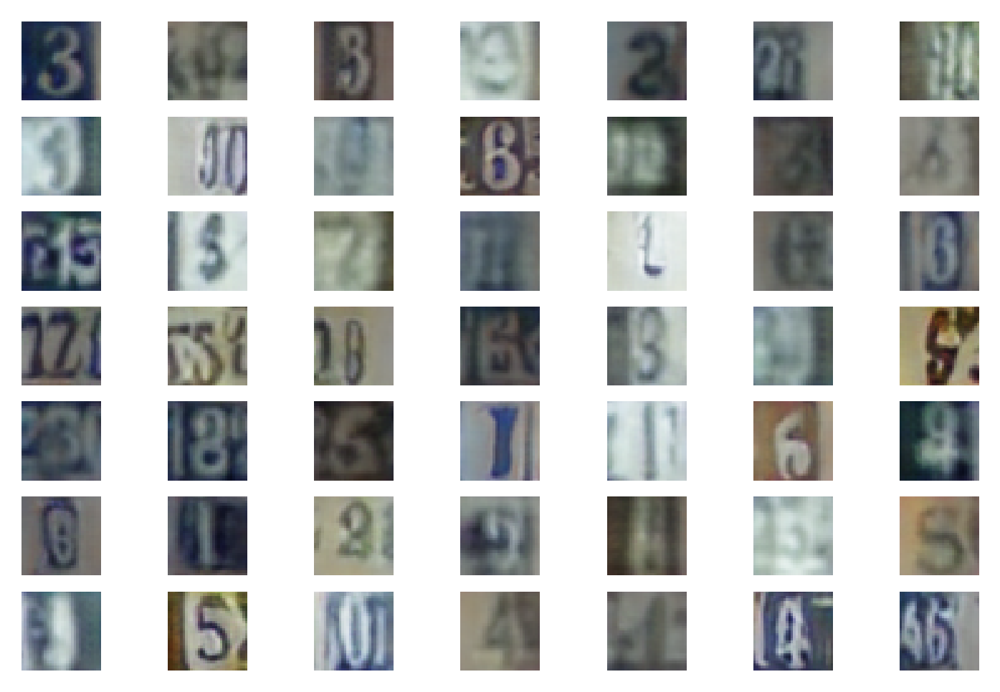

INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/generator/assets
INFO:tensorflow:Assets written to: trained_models/DCGAN_CELEBA_NOBN_40Epochs/discriminator/assets


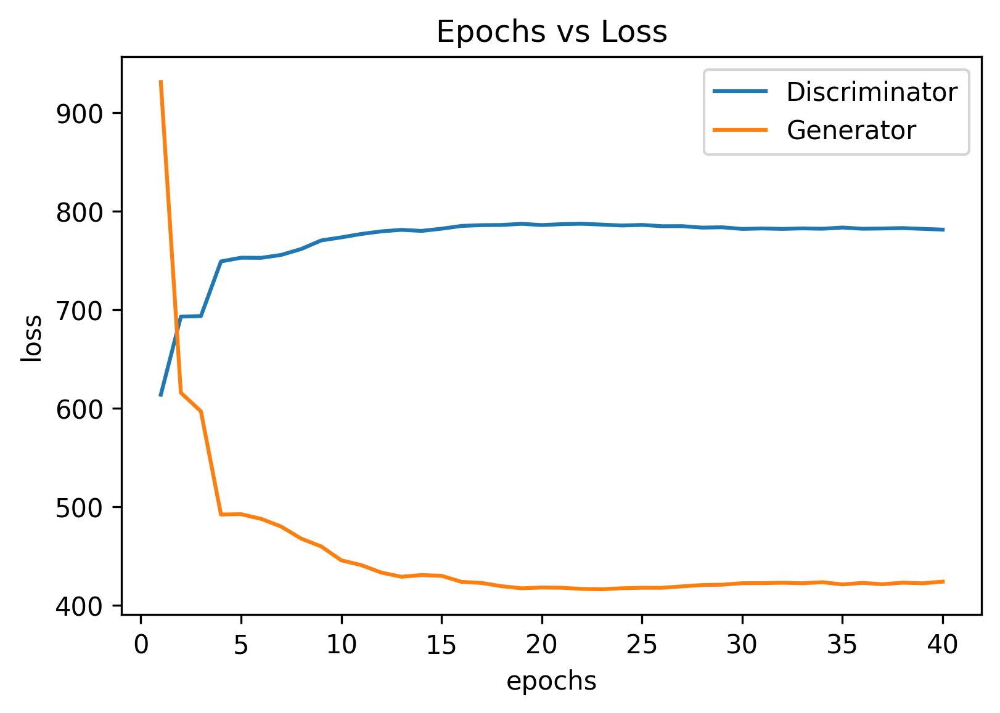

Done with training the model ......
CPU times: user 32min 48s, sys: 2min 27s, total: 35min 16s
Wall time: 1h 21min


In [12]:
%%time

# size of the latent space
samplesize = 100

# create the discriminator
discriminator = discriminator_(in_shape=(32,32,3), 
                               d_lr=0.0002,
                               d_beta=0.5)

# create the generator
generator = generator_(samplesize)

# create the gan
dcgan = dcgan_(generator, discriminator)

# train model
trained_generator = train(generator, discriminator, dcgan, X_train, samplesize, epochs=40, batch_size=128, model_name="DCGAN_SVHN_NOBN_40Epochs")

In [13]:
generate_video("dcgan_cifar_withbatchnorm")

Epoch evolutions video saved as results/dcgan_cifar_withbatchnorm/outputs_evolution.avi
